The functions used to interact with the UN Comtrade API is listed below.

The code is based on the following [script](https://github.com/ejokeeffe/tradedownloader), which I've modified such that I could run it on my machine as well as to be able to allow one to:
* To request export data
* To request aggregate trade volumes between countries, instead of a numeric HS code
* To request trade volumes all HS codes on a two-digit level, instead of for specific numeric HS codes alone


In [1]:
import requests
import pandas as pd
from os.path import join
import os
import time
import unicodedata
import numpy
import datetime
import sys
from os.path import isfile
import logging


class ComtradeApi:
    _source_folder = ""
    _url = 'http://comtrade.un.org/api/get?'
    _ctry_codes = []
    _ctry_alt_names = []
    _max_reporters = 5
    _max_years = 5
    _last_call_time = 0
    _working_df = []
    calls_in_hour = 0
    first_call = datetime.datetime.now()
    max_calls = 99


    def __init__(self, ctry_codes_path="UN Comtrade Country List.csv", fld=""):
        self._source_folder = fld
        # load the country codes
        self._ctry_codes = pd.read_csv(join(fld, ctry_codes_path), sep=';',keep_default_na=False, encoding="ISO-8859-1")
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['End Valid Year'] == 'Now']
        # Remove NES and other areas - check the field name for the country code
        if "Country Code" in self._ctry_codes.columns:
            self._ctry_codes['ctyCode'] = self._ctry_codes['Country Code']
        # World
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 0]
        # EU-27
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 97]
        # LAIA NES
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 473]
        # Oceania NES
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 527]
        # Europe NES
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 568]
        # Other Africa NES
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 577]
        # Bunkers - ship stores and aircraft supplies, which consists mostly of fuels and food
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 837]
        # Free Zones - the geographical and economic territory of a country but not to its customs territory
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 838]
        # Special Caegories - used by a reporting country if it does not want the partner breakdown to be disclosed
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 839]
        # Areas NES
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 899]
        # Neutral Zone
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 536]
        # North America and Central America, nes
        self._ctry_codes = self._ctry_codes.loc[self._ctry_codes['ctyCode'] != 637]
        # Finally remove where the iso codes are not available
        self._ctry_codes = self._ctry_codes.loc[pd.isnull(self._ctry_codes['ISO2-digit Alpha']) == False]
        self._ctry_codes = self._ctry_codes.loc[pd.isnull(self._ctry_codes['ISO3-digit Alpha']) == False]

        # now the country code alternative names
        # if this doesn't exist then create it
        if not isfile(join(fld, "country_alternative_names.csv")):
            # doesn't exist so create it
            self._ctry_alt_names = pd.DataFrame({'ISO2-digit Alpha': ['KR'],'Aka': ['South Korea']})
            # write this to file
            self._ctry_alt_names.to_csv(join(fld, "country_alternative_names.csv"), index=None)
        self._ctry_alt_names = pd.read_csv(join(fld, "country_alternative_names.csv"),keep_default_na=False)

        saved_queries_fname = join(self._source_folder, "saved_queries.csv")
        if (os.path.isfile(saved_queries_fname)):
            self._saved_queries = pd.read_csv(saved_queries_fname)
        else:
            self._saved_queries = pd.DataFrame({'id': [], 'querystring': [],'comcode': [], 'year': [], 'freq': []})
        self._saved_queries.comcode = self._saved_queries.comcode.astype( pd.np.str)
        self._saved_queries.freq = self._saved_queries.freq.astype(pd.np.str)
        self._saved_queries.querystring = self._saved_queries.querystring.astype(pd.np.str)

        
    def getComtradeData(self, comcodes=['1201'], reporter=['all'], partner=['all'],
                        years=[2016], freq='A', rg=['2'], fmt='json', rowmax=50000):

        # build string
        s = self._url + "type=C"
        s = "%s&freq=%s" % (s, freq)
        s = "%s&px=HS" % s
        if freq == 'A':
            s = "%s&ps=%s" % (s, "%2C".join([str(yr) for yr in years]))
        else:
            mons = [["%s%02d" % (yr, mon) for mon in range(1, 13)] for yr in years]
            s = "%s&ps=%s" % (s, "%2C".join(mons[0]))

        s = "%s&p=%s" % (s, "%2C".join(partner))
        
        # For large queries, it's possible we've stored the results
        if reporter[0] == "all" and partner[0] == "all":
            # Check if query has already been done
            df_base = []
            retain = []
            load_files = []
            for yr in years:
                haveit = True
                for com in comcodes:
                    if len(self._saved_queries.loc[(self._saved_queries.comcode == com) & (self._saved_queries.year == yr) & (self._saved_queries.freq == freq)]) == 0:
                        logging.info("Can't find %d and %s from local database. These will be retrieved from the Comtrade API." % (yr, com))
                        retain.append(yr)
                        haveit = False
                        break
                if haveit == True:
                    # print "we have it"
                    for com in comcodes:
                        fname = self._saved_queries.id.loc[(self._saved_queries.comcode == com) & (self._saved_queries.year == yr) & (self._saved_queries.freq == freq)].values[0]
                        # only load it if fname if >0
                        if (fname > -1):
                            load_files.append(fname)
                        else:
                            logging.info("{} for year {} and freq {} not available in comtrade. Fname: {}".format(com, yr, freq, fname))
            load_files = numpy.unique(load_files)
            for fname in load_files:
                fname = join(self._source_folder, "%d.csv" % fname)
                df_new = pd.read_csv(fname)
                # only keep current year
                if len(df_base) == 0:
                    df_base = df_new
                else:
                    df_base = df_base.append(df_new)
                    df_base.drop_duplicates(inplace=True)

            filter_years = years
            years = retain
            # logging.debug(years)
            if (len(years) == 0):
                # print "filled up so jumping out"
                # jump out
                df_base.drop_duplicates(inplace=True)
                # Only return wanted commodity codes
                if (comcodes != ['total']) and ((comcodes != ['ag2'])):
                    df_base = df_base.loc[df_base.cmdCode.isin([int(numeric_string) for numeric_string in comcodes])]

                if freq == 'A':
                    df_base = df_base.loc[df_base.period.isin(filter_years)]
                    df_base['date'] = [datetime.datetime(x, 1, 1) for x in df_base.period]
                if freq == 'M':
                    df_base['year'] = [int(str(x)[:4]) for x in df_base.period.values]
                    df_base = df_base.loc[df_base.year.isin(filter_years)]
                    df_base['date'] = [datetime.datetime(int(str(x)[:4]), int(str(x)[4:]), 1) for x in df_base.period]
                    df_base.drop('year', inplace=True, axis=1)
                df_base.reset_index(drop=True, inplace=True)
                return df_base
            df = []
            
            # can't pass both as all, iterate through country codes and add each
            # Need to split into calls of
            for start_year in range(0, len(years), self._max_years):
                df_cur_years = []
                for start_val in range(0, len(self._ctry_codes.ctyCode), self._max_reporters):
                    end_val = min([start_val + self._max_reporters, len(self._ctry_codes.ctyCode)])
                    end_year = min([start_year + self._max_years, len(years)])
                    # logging.info("%d,%d"%(start_year,end_year))
                    sub_reporters = self._ctry_codes.ctyCode.values[start_val:end_val]
                    sub_reporters = [str(com) for com in sub_reporters]
                    logging.debug("Running {} of {} subqueries for year(s) ".format(start_val, len(self._ctry_codes.ctyCode), years[start_year:end_year]))
                    # print sub_partners
                    new_data = self.getComtradeData(comcodes=comcodes, reporter=sub_reporters, partner=partner, years=years[start_year:end_year], freq=freq, rg=rg, fmt=fmt, rowmax=rowmax)
                    if len(df_cur_years) == 0:
                        df_cur_years = new_data
                    else:
                        # pass
                        try:
                            # print "appending..."
                            df_cur_years = df_cur_years.append(new_data)
                        except e:
                            logging.warning("Error trying to append new service call data")
                            exception_name, exception_value = sys.exc_info()[:2]
                            raise   # or don't -- it's up to you

                id = 0
                if len(df_cur_years) == 0:
                    id = -1
                elif (len(self._saved_queries.id) == 0):
                    id = 0
                else:
                    id = max(self._saved_queries.id.values) + 1
                logging.info("Writing {}/{} to file with id:{}".format(comcodes, years[start_year:end_year], id))
                for yr in years[start_year:end_year]:
                    for com in comcodes:
                        df_new = pd.DataFrame({'id': [id], 'querystring': [s],'comcode': [com], 'year': [yr], 'freq': [freq]})
                        self._saved_queries = self._saved_queries.append(df_new)
                self._saved_queries.to_csv(join(self._source_folder,"saved_queries.csv"), index=None)
                if id > -1:
                    # unencode from unicode
                    df_cur_years.rtTitle = df_cur_years.rtTitle.apply(lambda x: unicodedata.normalize('NFKD', x).encode('ascii', 'ignore'))
                    df_cur_years.ptTitle = df_cur_years.ptTitle.apply(lambda x: unicodedata.normalize('NFKD', x).encode('ascii', 'ignore'))

                    # self._working_df=df_cur_years
                    df_cur_years.to_csv(join(self._source_folder, "%d.csv" % id), index=None)

                    # Now merge this with df
                    if len(df) == 0:
                        df = df_cur_years
                    else:
                        try:
                            # print "appending..."
                            df = df.append(df_cur_years)
                        except e:
                            logging.warning("Error trying to append. Years: {}. Com: {}".format(years[start_year:end_year], comcodes))
                            exception_name, exception_value = sys.exc_info()[:2]
                            raise
            logging.debug("Have the merged dataset")

            if len(df_base) > 0:
                # print df_base.head()
                df = df.append(df_base)
                # keep unique rows
                if len(df) > 0:
                    df.drop_duplicates(inplace=True)
            
            # Only return wanted commodity codes
            if (len(df) > 0) and (comcodes != ['total']) and (comcodes != ['ag2']):
                # ensure cmdCode is an integer
                df.cmdCode = df.cmdCode.astype(pd.np.int)
                df.period = df.period.astype(pd.np.int)
                df = df.loc[df.cmdCode.isin([int(numeric_string) for numeric_string in comcodes])]
                # if freq=='A':
                df = df.loc[df.yr.isin(filter_years)]
                # print df.head()
            return df
        else:
            s = "%s&r=%s" % (s, "%2C".join(reporter))
        
        s = "%s&rg=%s" % (s, "%2C".join(rg))
        s = "%s&cc=%s" % (s, "%2C".join(comcodes))
        s = "%s&fmt=%s" % (s, fmt)
        s = "%s&max=%d" % (s, rowmax)
        s = "%s&head=M" % (s)

        # first we need to figure out if we can do the call - we may have exceeded our allowable calls
        if (ComtradeApi.first_call < datetime.datetime.now() + datetime.timedelta(hours=-1)):
            # we've waiting long enough
            ComtradeApi.first_call = datetime.datetime.now()
            ComtradeApi.calls_in_hour = 0
        else:
            # we're within time, so check how many we have left
            if (ComtradeApi.calls_in_hour + 1 < ComtradeApi.max_calls):
                logging.info("you've made %d calls this hour, %d left" %(ComtradeApi.calls_in_hour + 1, ComtradeApi.max_calls - ComtradeApi.calls_in_hour - 1))
                ComtradeApi.calls_in_hour += 1
            else:
            # Need to wait for an hour
                waiting_time = datetime.timedelta(hours=1.05)
                logging.warning("You've exceeded the max calls in an hour, so now you'll have to wait until {}".format(datetime.datetime.now() + waiting_time))
                sys.stdout.flush()
                time.sleep(waiting_time.total_seconds())
                logging.debug("Stepping out of waiting. Time: {}".format(datetime.datetime.now()))
                ComtradeApi.first_call = datetime.datetime.now()
                ComtradeApi.calls_in_hour = 0
        # print "Doing an api call"
        logging.info(s)
        waiting_time = round(time.time() * 1000) - self._last_call_time
        if (waiting_time < 1000):
            # print waiting_time
            #print("Sleeping for %.0f"%(1000-waiting_time))
            time.sleep(float(1000 - waiting_time) / 1000)
        r = requests.get(r'%s' % (s))
        self._last_call_time = round(time.time() * 1000.0)
        # print self._last_call_time
        try:
            data = r.json()
        except:
            logging.warning("No json object to be parsed")
            logging.warning("Trying running the string below in your browser -is there an error?")
            logging.warning("return string: {}".format(r))
            logging.warning("%s" % s)
            exception_name, exception_value = sys.exc_info()[:2]
            logging.warning("{} {}".format(exception_name, exception_value))
            raise

            return []
        df = pd.DataFrame(data['dataset'])
        logging.info("Returned rows: %d" % df.shape[0])

        return df

Here I import a .csv file with the regions and subregions for all countries. I also find the coordinates for these countries, which ends up being unneccesary.

In [2]:
import pandas as pd
region = pd.read_csv("iso_region.csv", keep_default_na=False, encoding="ISO-8859-1")
region['ptregion']=region['region']
region['ptsub-region']=region['sub-region']
region['rtregion']=region['region']
region['rtsub-region']=region['sub-region']

In [3]:
countries = list(region.name)
geocode = pd.DataFrame(columns=['Country','Latitude','Longitude'])
from geopy.geocoders import Nominatim
from geopy import geocoders 
for name in countries:
    geolocator = Nominatim()
    location = geolocator.geocode(name, timeout=10)
    if location==None:
        geocode = geocode.append({'Country':'NA','Latitude': 'NA', 'Longitude': 'NA'}, ignore_index=True)
    else:
        address, (latitude, longitude) = geolocator.geocode(name, language='en', timeout=10)
        geocode = geocode.append({'Country':name,'Latitude': latitude, 'Longitude': longitude}, ignore_index=True)
geocode.head()

,Country,Latitude,Longitude
0,Afghanistan,33.768,66.2385
1,Ã land Islands,60.2166,19.9439
2,Albania,41,20
3,Algeria,28,2.99998
4,American Samoa,-14.3006,-170.696


In [4]:
region = pd.merge(region, geocode[['Country','Latitude','Longitude']], 
                  left_on='name', right_on='Country', how='left')
region.head()

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code,ptregion,ptsub-region,rtregion,rtsub-region,Country,Latitude,Longitude
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,,142,034,,Asia,Southern Asia,Asia,Southern Asia,Afghanistan,33.768,66.2385
1,Ã land Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,,150,154,,Europe,Northern Europe,Europe,Northern Europe,Ã land Islands,60.2166,19.9439
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,,150,039,,Europe,Southern Europe,Europe,Southern Europe,Albania,41,20
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,,002,015,,Africa,Northern Africa,Africa,Northern Africa,Algeria,28,2.99998
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,,009,061,,Oceania,Polynesia,Oceania,Polynesia,American Samoa,-14.3006,-170.696


Here I import a .csv file with GDP in current USD for all countries from 1960 to 2016 (might go unused). 

In [151]:
gdp = pd.read_csv("GDP.csv", sep = ';', keep_default_na=False, encoding="ISO-8859-1")
gdp.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,Aruba,ABW,GDP (current US$),NY.GDP.MKTP.CD,,,,,,,...,2791960894,2498932961,2467703911,2584463687,,,,,,
1,Afghanistan,AFG,GDP (current US$),NY.GDP.MKTP.CD,"537777811,1","548888895,6","546666677,8","751111191,1","800000044,4",1006666638,...,10190529882,12486943506,15936800636,17930239400,20536542737,20264253974,20616104298,19215562179,19469022208,
2,Angola,AGO,GDP (current US$),NY.GDP.MKTP.CD,,,,,,,...,84178032716,75492384801,82470913121,"1,04116E+11","1,15398E+11","1,24912E+11","1,26777E+11","1,02962E+11",95335111741,
3,Albania,ALB,GDP (current US$),NY.GDP.MKTP.CD,,,,,,,...,12881352688,12044212904,11926953259,12890867539,12319784787,12776277515,13228244357,11335264967,11863865978,
4,Andorra,AND,GDP (current US$),NY.GDP.MKTP.CD,,,,,,,...,4007353157,3660530703,3355695364,3442062830,3164615187,3281585236,3350736367,2811489409,2858517699,


Here I request total exports between countries from 1990 to 2017 and save the results. Afterwards I clean the data and add regions for both reporter and partner countries.

In [5]:
#comapi=ComtradeApi()
#yrs = list(range(1990,2018))
#totalx = comapi.getComtradeData(comcodes=['total'], reporter=['all'], partner=['all'], years=yrs, freq='A', rg=['2'], fmt='json', rowmax=100000)
#totalx.to_csv('TotalExports19922017.csv')

totalx = pd.read_csv('TotalExports19922017.csv')

total = totalx[['cmdCode','TradeValue','rgDesc','rtCode','rtTitle','rt3ISO', 'ptCode', 'ptTitle', 'pt3ISO','yr']]
# Clean names
total.is_copy = False 
total['rtTitle'] = total['rtTitle'].str.extract(r"b'([A-Za-z]+)'", expand=False)
total['ptTitle'] = total['ptTitle'].str.extract(r"b'([A-Za-z]+)'", expand=False)
# Remove each countries total world exports
total = total[total.ptCode != 0]
# Add regions and sub regions for all reporters and partners
total = pd.merge(total, region[['alpha-3','rtregion','rtsub-region']], 
                 left_on='rt3ISO', right_on='alpha-3', how='left')
total = pd.merge(total, region[['alpha-3','ptregion','ptsub-region']],
                 left_on='pt3ISO', right_on='alpha-3', how='left')
# Check out results
total.head()

,cmdCode,TradeValue,rgDesc,rtCode,rtTitle,rt3ISO,ptCode,ptTitle,pt3ISO,yr,alpha-3_x,rtregion,rtsub-region,alpha-3_y,ptregion,ptsub-region
0,TOTAL,1004202,Export,12,Algeria,DZA,20,Andorra,AND,1992,DZA,Africa,Northern Africa,AND,Europe,Southern Europe
1,TOTAL,10239625,Export,12,Algeria,DZA,32,Argentina,ARG,1992,DZA,Africa,Northern Africa,ARG,Americas,Latin America and the Caribbean
2,TOTAL,206921040,Export,12,Algeria,DZA,40,Austria,AUT,1992,DZA,Africa,Northern Africa,AUT,Europe,Western Europe
3,TOTAL,4383,Export,12,Algeria,DZA,44,Bahamas,BHS,1992,DZA,Africa,Northern Africa,BHS,Americas,Latin America and the Caribbean
4,TOTAL,3344,Export,12,Algeria,DZA,50,Bangladesh,BGD,1992,DZA,Africa,Northern Africa,BGD,Asia,Southern Asia


Map of the aggregate exports for each country to the rest of the world (the world_map() function is defined at the bottom of the notebook).

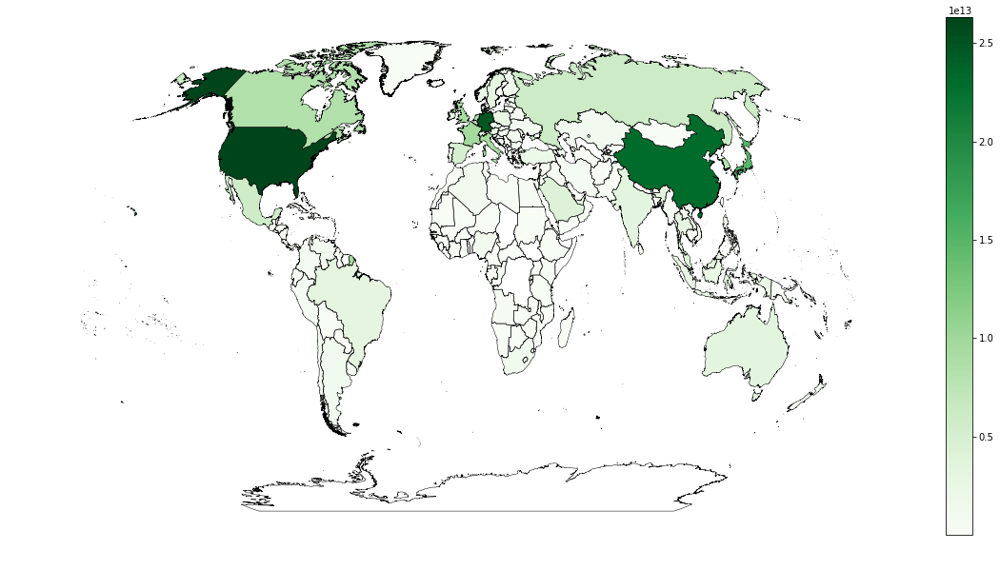

In [447]:
total_ex = pd.DataFrame({'TradeValue' : total.groupby( ["rt3ISO"] )["TradeValue"].sum()}).reset_index()
world_map(total_ex)

**Figures of the growth in global trade over the years**

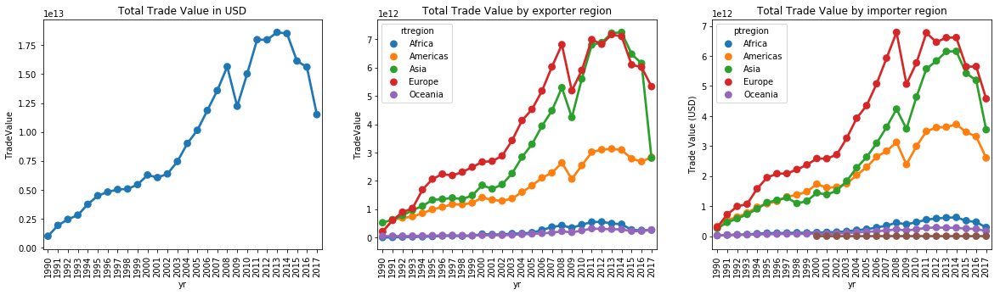

In [7]:
#   Visuals
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize']=(20,5)

fig = plt.figure()
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

ttv = pd.DataFrame({'TradeValue' : total.groupby( ["yr"] )["TradeValue"].sum()}).reset_index()
dfgr = pd.concat([ttv])
sns.pointplot(ax=ax1,x="yr",y="TradeValue",data=dfgr)
_ = ax1.set_title('Total Trade Value in USD')
_ = ax1.tick_params(axis='x', rotation=90)
_ = ax3.set_ylabel('Trade Value (USD)')

trex = pd.DataFrame({'TradeValue' : total.groupby( ["yr","rtregion"] )["TradeValue"].sum()}).reset_index()
dfgr = pd.concat([trex])
sns.pointplot(ax=ax2,x="yr",y="TradeValue",data=dfgr,hue='rtregion')
_ = ax2.set_title('Total Trade Value by exporter region')
_ = ax2.tick_params(axis='x', rotation=90)
_ = ax3.set_ylabel('Trade Value (USD)')

trim = pd.DataFrame({'TradeValue' : total.groupby( ["yr","ptregion"] )["TradeValue"].sum()}).reset_index()
dfgr = pd.concat([trim])
sns.pointplot(ax=ax3,x="yr",y="TradeValue",data=dfgr,hue='ptregion')
_ = ax3.set_title('Total Trade Value by importer region')
_ = ax3.tick_params(axis='x', rotation=90)
_ = ax3.set_ylabel('Trade Value (USD)')

**Graph characteristics**

In [12]:
tgraph = pd.DataFrame(columns=['Year','Nodes','Edges','Average Degree', 
                               'Density', 'Degree Assortativity', 'Diamenter'])

for year in sorted(list(total['yr'].unique())):
    helper=total[total['yr'] == year]
    G = nx.from_pandas_edgelist(helper, 'rt3ISO', 'pt3ISO', edge_attr=['TradeValue'], create_using=nx.DiGraph())
    nodes = len(nx.nodes(G))
    edges = len(nx.edges(G))
    ad = edges/nodes
    den = nx.density(G)
    aspl = nx.average_shortest_path_length(G)
    r = nx.degree_pearson_correlation_coefficient(G, x='out', y='in',weight='TradeValue')
    test=dict(nx.all_pairs_shortest_path_length(G))
    maxdia=0
    for node in G.nodes():
        dia=max(test[node].values())
        if dia > maxdia:
            maxdia=dia
    tgraph = tgraph.append({'Year': year, 'Nodes':nodes,'Edges':edges,'Average Degree':ad,
                            'Density':den, 'Degree Assortativity':r, 'Diameter':maxdia}, ignore_index=True)

tgraph.to_csv('trade_char.csv')
tgraph

,Year,Nodes,Edges,Average Degree,Density,Degree Assortativity,Diamenter,Diameter
0,1990.0,197.0,4055.0,20.583756,0.105019,-0.035039,NaN,2.0
1,1991.0,195.0,5052.0,25.907692,0.133545,-0.061169,NaN,2.0
2,1992.0,216.0,6969.0,32.263889,0.150065,-0.066344,NaN,2.0
3,1993.0,218.0,8662.0,39.733945,0.183106,-0.066221,NaN,3.0
4,1994.0,218.0,11331.0,51.977064,0.239526,-0.076298,NaN,3.0
5,1995.0,218.0,12421.0,56.977064,0.262567,-0.081318,NaN,3.0
6,1996.0,214.0,13521.0,63.182243,0.296630,-0.082115,NaN,3.0
7,1997.0,214.0,14242.0,66.551402,0.312448,-0.080400,NaN,3.0
8,1998.0,214.0,15155.0,70.817757,0.332478,-0.073492,NaN,3.0
9,1999.0,215.0,16183.0,75.269767,0.351728,-0.073762,NaN,3.0


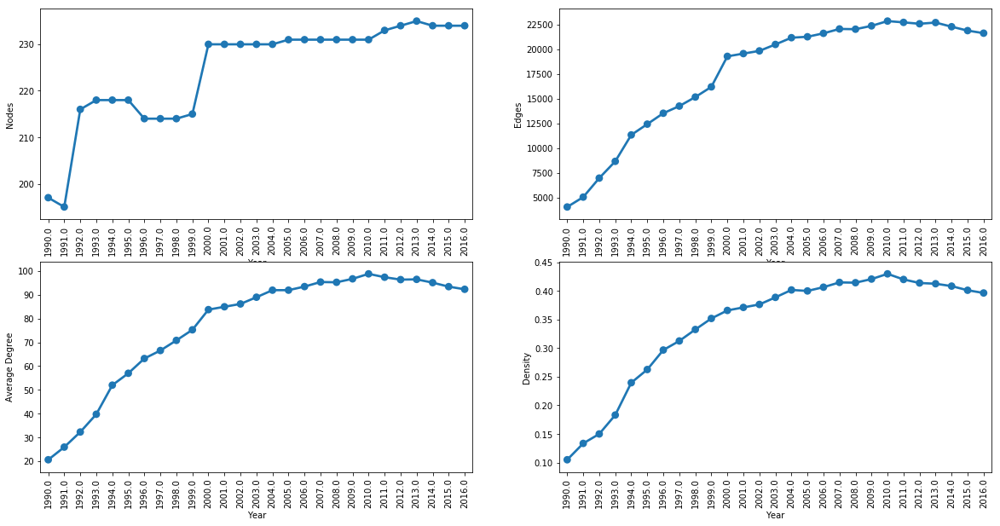

In [20]:
plt.rcParams['figure.figsize']=(20,10)

fig = plt.figure()
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

sns.pointplot(ax=ax1,x="Year",y="Nodes",data=tgraph[0:27])
_ = ax1.tick_params(axis='x', rotation=90)

sns.pointplot(ax=ax2,x="Year",y="Edges",data=tgraph[0:27])
_ = ax2.tick_params(axis='x', rotation=90)

sns.pointplot(ax=ax3,x="Year",y="Average Degree",data=tgraph[0:27])
_ = ax3.tick_params(axis='x', rotation=90)

sns.pointplot(ax=ax4,x="Year",y="Density",data=tgraph[0:27])
_ = ax4.tick_params(axis='x', rotation=90)

**2016 Trade Network as a Directed Graph**

In [351]:
import networkx as nx
import matplotlib.pyplot as plt
ex2016=total[total['yr'] == 2016]
G16 = nx.from_pandas_edgelist(ex2016, 'rt3ISO', 'pt3ISO', edge_attr=['TradeValue'], create_using=nx.DiGraph())
print(nx.info(G16))

Name: 
Type: DiGraph
Number of nodes: 234
Number of edges: 21603
Average in degree:  92.3205
Average out degree:  92.3205


**Adjacency matrices**

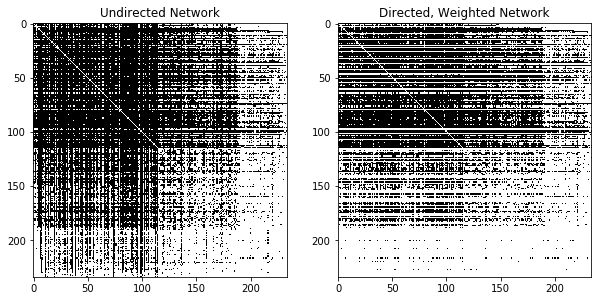

In [11]:
import matplotlib.colors as colors
from matplotlib import pyplot, patches
import numpy as np

plt.rcParams['figure.figsize']=(10,5)

adjacency_undir = nx.to_numpy_matrix(G16.to_undirected(), dtype=np.bool)
adjacency_dir = nx.to_numpy_matrix(G16, weight='TradeValue')

fig = plt.figure()
ax1a = fig.add_subplot(121)
pyplot.imshow(adjacency_undir,cmap="Greys",interpolation="none")
ax1a.set_title('Undirected Network')
ax2a = fig.add_subplot(122)
pyplot.imshow(adjacency_dir,cmap="Greys", norm = colors.Normalize(vmin=0,vmax=1.),interpolation="none")
#draw_adjacency_matrix(G16)
ax2a.set_title('Directed, Weighted Network')

plt.show()

**Function to calculate total exports**

In [ ]:
def totexp(G, size=100000):
    # Blank dictionary to store total exports
    totexp = {}
    edgetv = list(G.edges.data('TradeValue'))

    # Calculate total exports of each country in the network
    for exp in G.nodes():
        tx=0
        for row in range(0,(len(G.edges())-1)):
            a, b, c = edgetv[row]
            if a==exp:
                tx=(c)+tx
        totexp[exp] = tx

    nx.set_node_attributes(G, totexp, 'totexp')

    # Calculate average and total exports
    avgexp = sum(totexp.values()) / float(len(totexp))
    totalexp= sum(totexp.values())

    # Use the results later for the node's size in the graph
    node_size = [float(G.node[v]['totexp'])*size / totalexp for v in G]
    return node_size

**Graph of network 2016** - node size is total exports

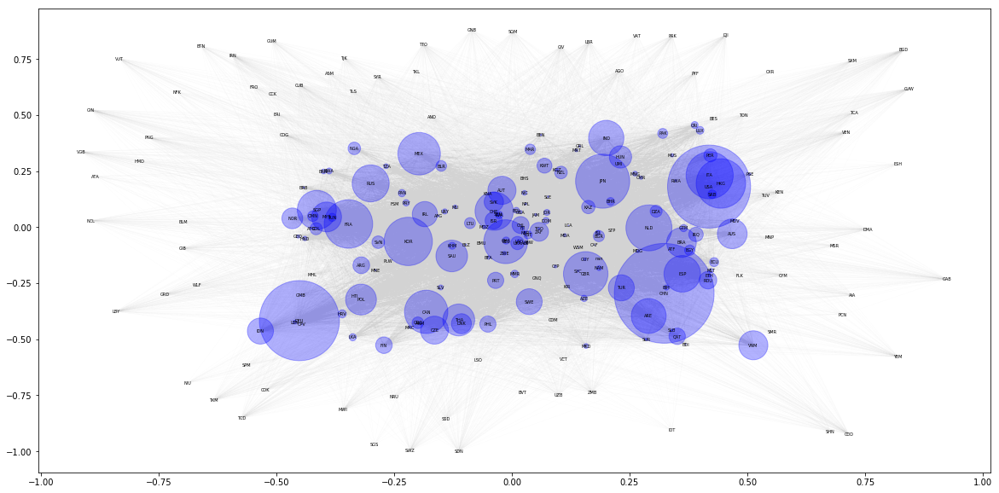

In [246]:
plt.rcParams['figure.figsize']=(20,10)

node_size = totexp(G16, size=100000)
pos = nx.spring_layout(G16, iterations=2)
nx.draw_networkx_nodes (G16, pos, cmap = plt.get_cmap('Dark2'), node_color = 'blue',
                        node_size = node_size , with_labels = False, alpha=0.3)
nx.draw_networkx_edges (G16, pos, alpha = .5, edge_color='lightgray', arrows=False, width=0.05)
nx.draw_networkx_labels(G16,pos,font_size=5)

plt.show()

**Same graph - just for 1990**

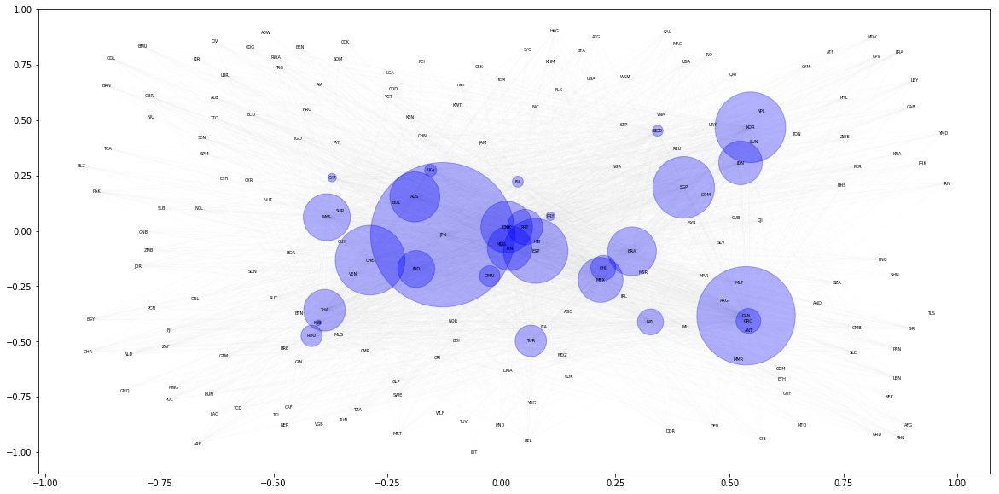

In [249]:
ex1990=total[total['yr'] == 1990]
G90 = nx.from_pandas_edgelist(ex1990, 'rt3ISO', 'pt3ISO', edge_attr=['TradeValue'], create_using=nx.DiGraph())

node_size_90 = node_size = totexp(G90, size=100000)

pos = nx.spring_layout(G90, iterations=2)
nx.draw_networkx_nodes (G90, pos, cmap = plt.get_cmap('Dark2'), node_color = 'blue',
                        node_size = node_size_90 , with_labels = False, alpha=0.3)
nx.draw_networkx_edges (G90, pos, alpha = .5, edge_color='lightgray', arrows=False, width=0.05)
nx.draw_networkx_labels(G90,pos,font_size=5)

plt.show()

**Side by side comparison of 1990 and 2016**

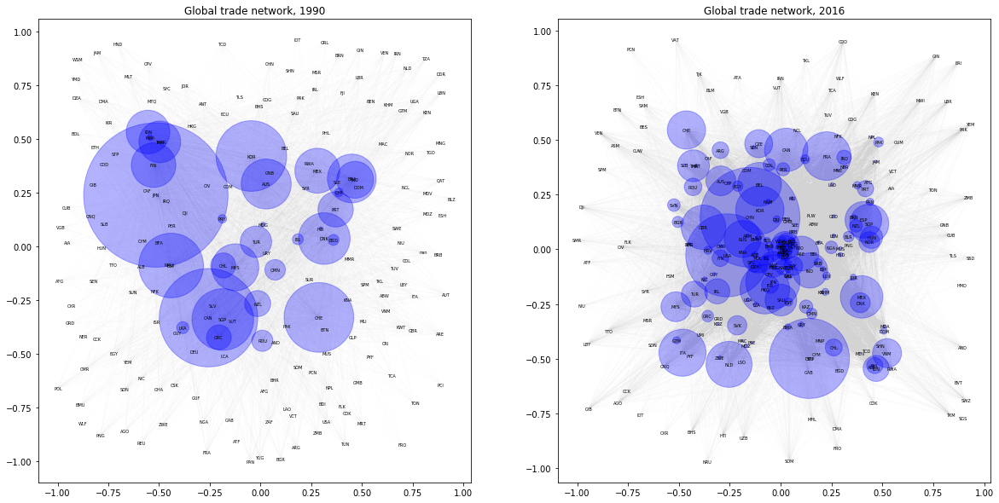

In [251]:
plt.rcParams['figure.figsize']=(20,10)
fig = plt.figure()

fig.add_subplot(121)
pos = nx.spring_layout(G90, iterations=2)
nx.draw_networkx_nodes (G90, pos, cmap = plt.get_cmap('Dark2'), node_color = 'blue',
                        node_size = node_size_90 , with_labels = False, alpha=0.3)
nx.draw_networkx_edges (G90, pos, alpha = .5, edge_color='lightgray', arrows=False, width=0.05)
nx.draw_networkx_labels(G90,pos,font_size=5)
plt.title('Global trade network, 1990')

fig.add_subplot(122)
pos = nx.spring_layout(G16, iterations=2)
nx.draw_networkx_nodes (G16, pos, cmap = plt.get_cmap('Dark2'), node_color = 'blue',
                        node_size = node_size , with_labels = False, alpha=0.3)
nx.draw_networkx_edges (G16, pos, alpha = .5, edge_color='lightgray', arrows=False, width=0.05)
nx.draw_networkx_labels(G16,pos,font_size=5)
plt.title('Global trade network, 2016')

plt.show()

**Degree distribution function**

In [46]:
def plot_degree_distribution(network, degree='Total'):
    degs = {}
    for n in network.nodes():
        if n != None:
            if degree=='Total':
                deg = network.degree(n)
            if degree=='In':
                deg = network.in_degree(n)
            if degree=='Out':
                deg = network.out_degree(n)
        if deg not in degs:
            degs[deg] = 0
        degs[deg] += 1
    items = sorted(degs.items())
    N = network.order()
    plt.plot([k for (k,v) in items], [v/N for (k,v) in  items ], color = 'blue')
    plt.xlabel('Degree, k', fontsize = 8)
    plt.ylabel('Pr(k)', fontsize = 8)
    plt.title('%s Degree Distribution'%degree)
    #plt.show()

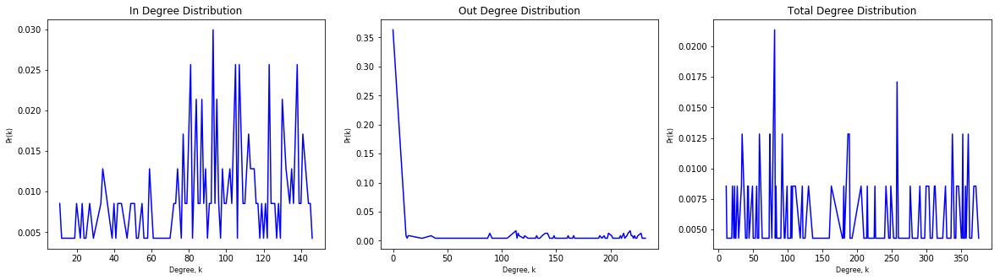

In [45]:
plt.rcParams['figure.figsize']=(20,5)

fig = plt.figure()
fig.add_subplot(131)
plot_degree_distribution(G16,degree='In')
fig.add_subplot(132)
plot_degree_distribution(G16, degree='Out')
fig.add_subplot(133)
plot_degree_distribution(G16, degree='Total')

plt.show()

**Node strength**

In [187]:
def plot_node_strength_distribution(network, degree='Total'):
    degs = {}
    for n in network.nodes():
        if n != None:
            if degree=='Total':
                deg = network.degree(n, weight='TradeValue')
            if degree=='In':
                deg = network.in_degree(n, weight='TradeValue')
            if degree=='Out':
                deg = network.out_degree(n, weight='TradeValue')
        if deg not in degs:
            degs[deg] = 0
        degs[deg] += 1
    items = sorted(degs.items())
    N = network.order()
    bins= list(range(0,4000000000000,100000000000))
    plt.hist([k for (k,v) in items], bins = bins, color = 'blue')
    plt.yscale('log')
    plt.xlabel('Node strength in USD', fontsize = 8)
    plt.ylabel('log(Number of occurences)', fontsize = 8)
    plt.title('%s Strength Distribution'%degree)
    #plt.show()

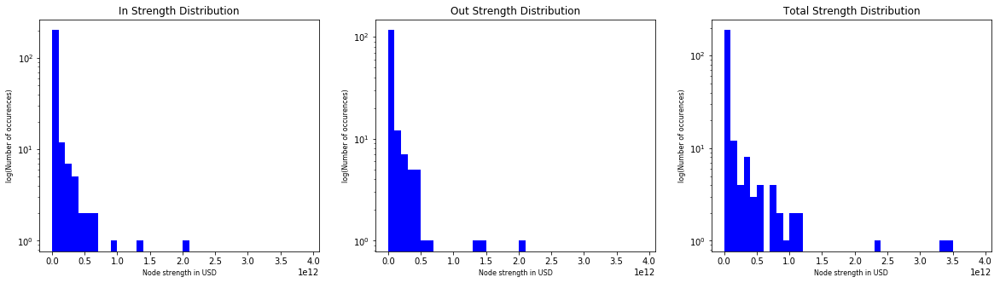

In [188]:
plt.rcParams['figure.figsize']=(20,5)

fig = plt.figure()
fig.add_subplot(131)
plot_node_strength_distribution(G16, degree='In')
fig.add_subplot(132)
plot_node_strength_distribution(G16, degree='Out')
fig.add_subplot(133)
plot_node_strength_distribution(G16, degree='Total')

plt.show()

**Degree/strength scatter plot**

In [61]:
def plot_degree_strength_scatter(network, degree='Total'):
    ds = pd.DataFrame(columns=['Node','Degree','Strength'])
    for n in network.nodes():
        if n != None:
            if degree=='Total':
                deg = network.degree(n)
                stre = network.degree(n, weight='TradeValue')
            if degree=='In':
                deg = network.in_degree(n)
                stre = network.in_degree(n, weight='TradeValue')
            if degree=='Out':
                deg = network.out_degree(n)
                stre = network.out_degree(n, weight='TradeValue')
        ds = ds.append({'Node':n, 'Degree':deg, 'Strength':stre}, ignore_index=True)            
    plt.scatter(x=ds.Degree,y=ds.Strength, color = 'blue')
    plt.xlabel('Node Degree', fontsize = 8)
    plt.ylabel('Node Strength', fontsize = 8)
    plt.title('%s Degree'%degree)

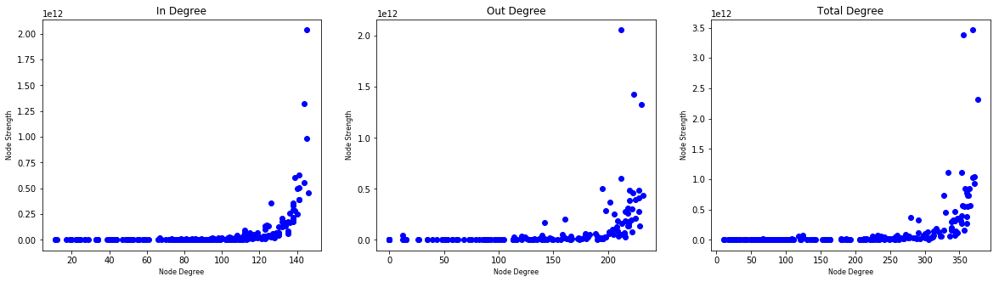

In [63]:
plt.rcParams['figure.figsize']=(20,5)

fig = plt.figure()
fig.add_subplot(131)
plot_degree_strength_scatter(G16, degree='In')
fig.add_subplot(132)
plot_degree_strength_scatter(G16, degree='Out')
fig.add_subplot(133)
plot_degree_strength_scatter(G16, degree='Total')

plt.show()

**Assortativity** - Average nearest neighbour degree distribution

In [182]:
def knn_scatter(G, source = 'in', target = 'in', weight=None):
    degs, knn = zip(*nx.average_degree_connectivity(G16, source=source, target=target, weight=weight).items())
    plt.scatter(x=degs,y=knn, color = 'blue')
    plt.xlabel('Node %s degree'%source, fontsize = 8)
    plt.ylabel('Average neighbour %s degree'%target, fontsize = 8)
    #plt.title('KNN distribution')

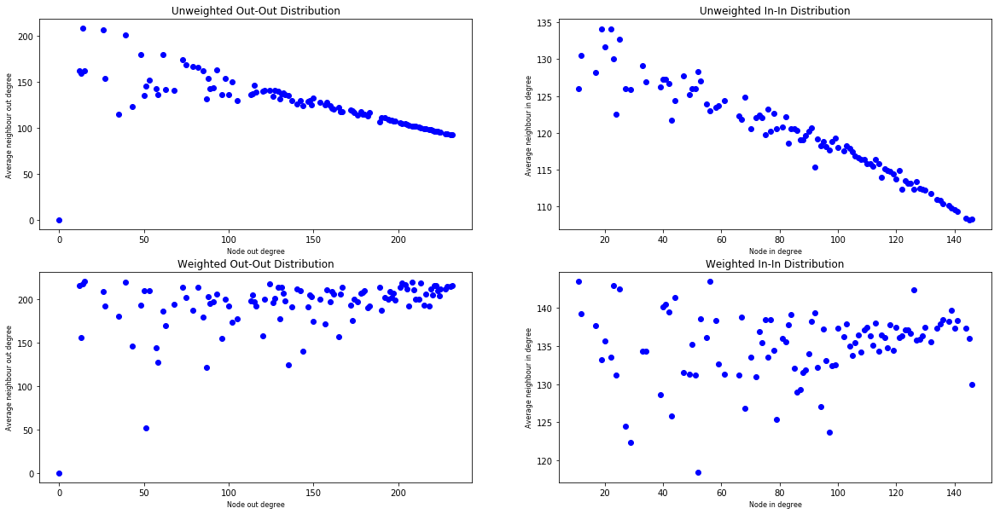

In [184]:
plt.rcParams['figure.figsize']=(20,10)

fig = plt.figure()
fig.add_subplot(221)
knn_scatter(G16, source = 'out', target = 'out')
plt.title('Unweighted Out-Out Distribution')
fig.add_subplot(222)
knn_scatter(G16, source = 'in', target = 'in')
plt.title('Unweighted In-In Distribution')
fig.add_subplot(223)
knn_scatter(G16, source = 'out', target = 'out', weight='TradeValue')
plt.title('Weighted Out-Out Distribution')
fig.add_subplot(224)
knn_scatter(G16, source = 'in', target = 'in', weight='TradeValue')
plt.title('Weighted In-In Distribution')

plt.show()

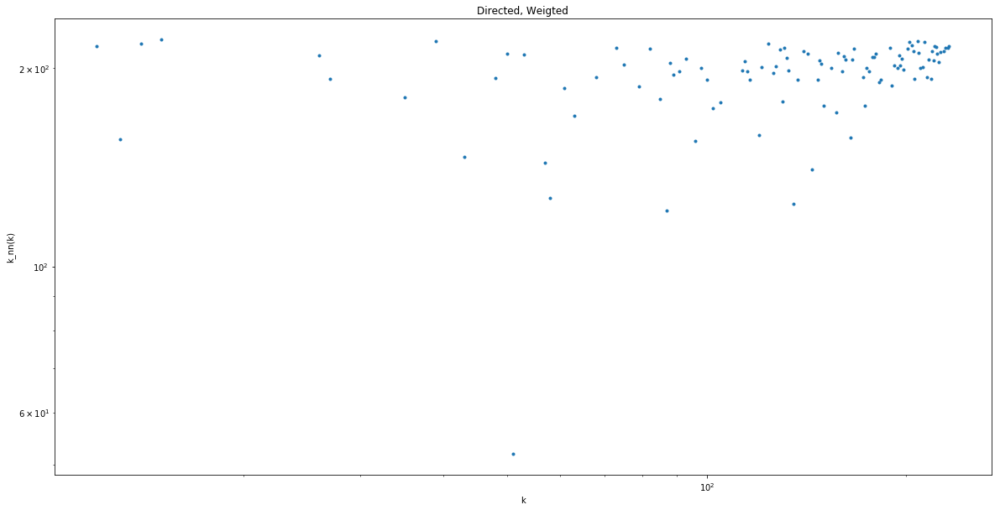

In [180]:
import numpy as np
plt.rcParams['figure.figsize']=(20,10)

fig = plt.figure()
tt4 = fig.add_subplot(111)
adc_tt = nx.average_degree_connectivity(G16, source='out', target='out',weight='TradeValue')
plt.loglog(*zip(*sorted(adc_tt.items())),'.')
#plt.plot(np.arange(0, 500), np.arange(0, 500),'--',label='x=y')
plt.xlabel('k')
plt.ylabel('k_nn(k)')
tt4.set_title('Directed, Weigted')

plt.show()

**Assortativity** - Degree (Pearson) Correlation Coefficient

In [136]:
dcc = pd.DataFrame(columns=['Year','In-In','In-Out','Out-In', 'Out-Out'])

for year in sorted(list(total['yr'].unique())):
    helper=total[total['yr'] == year]
    G = nx.from_pandas_edgelist(helper, 'rt3ISO', 'pt3ISO', edge_attr=['TradeValue'], create_using=nx.DiGraph())
    ii = nx.degree_pearson_correlation_coefficient(G, x='in', y='in', weight='TradeValue')
    io = nx.degree_pearson_correlation_coefficient(G, x='in', y='out', weight='TradeValue')
    oi = nx.degree_pearson_correlation_coefficient(G, x='out', y='in', weight='TradeValue')
    oo = nx.degree_pearson_correlation_coefficient(G, x='out', y='out', weight='TradeValue')
    dcc = dcc.append({'Year':year, 'In-In':ii, 'In-Out':io,' Out-In':oi, 'Out-Out':oo}, ignore_index=True)

dcc.to_csv('degree_corr_coefs.csv')
dcc

,Year,In-In,In-Out,Out-In,Out-Out,Out-In
0,1990.0,-0.032822,-0.038815,NaN,-0.042425,-0.035039
1,1991.0,-0.059107,-0.042059,NaN,-0.045508,-0.061169
2,1992.0,-0.061702,-0.049055,NaN,-0.053866,-0.066344
3,1993.0,-0.061781,-0.055265,NaN,-0.060328,-0.066221
4,1994.0,-0.071811,-0.070613,NaN,-0.075702,-0.076298
5,1995.0,-0.077732,-0.076022,NaN,-0.080045,-0.081318
6,1996.0,-0.077705,-0.077313,NaN,-0.082161,-0.082115
7,1997.0,-0.073444,-0.075603,NaN,-0.083206,-0.080400
8,1998.0,-0.065970,-0.068937,NaN,-0.077391,-0.073492
9,1999.0,-0.064260,-0.071742,NaN,-0.083109,-0.073762


/anaconda3/lib/python3.6/site-packages/pandas/plotting/_core.py:1716: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  series.name = label


Text(0.5,1,'Degree Pearson Correlation Coefficient')

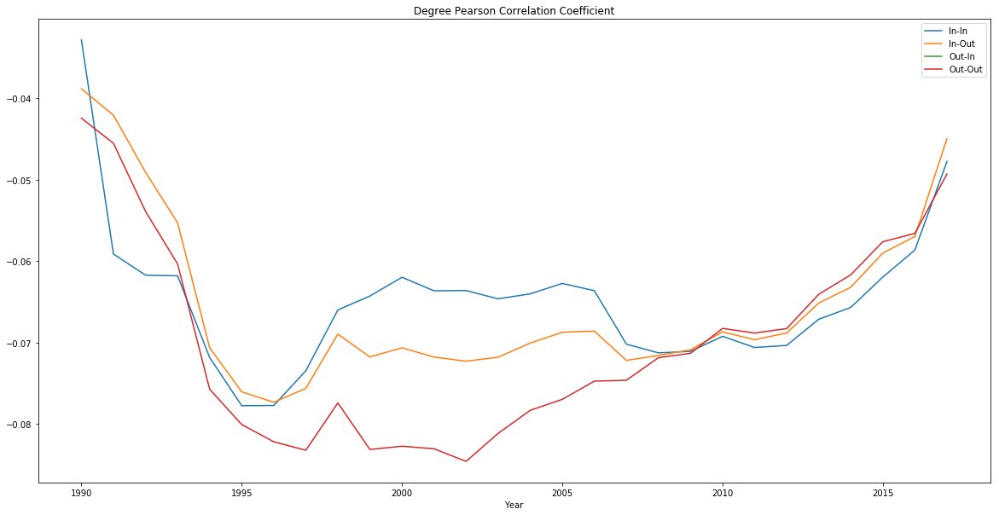

In [138]:
plt.rcParams['figure.figsize']=(20,10)
dcc.plot(x="Year", y=["In-In", "In-Out", "Out-In", "Out-Out"])
plt.title('Degree Pearson Correlation Coefficient')

**Assortativity** - Assortative mixing (region, sub-region and GDP)

In [152]:
area_dict = dict(zip(region['alpha-3'], region['region']))
nx.set_node_attributes(G16, area_dict, 'region')
nx.attribute_assortativity_coefficient(G16, "region")

0.036869706354855

In [154]:
area_dict = dict(zip(region['alpha-3'], region['sub-region']))
nx.set_node_attributes(G16, area_dict, 'subregion')
nx.attribute_assortativity_coefficient(G16, "subregion")

0.025371526108908787

In [153]:
gdp2016 =  dict(zip(gdp['Country Code'], gdp['2016']))
nx.set_node_attributes(G16, gdp2016, 'gdp')
nx.attribute_assortativity_coefficient(G16, "gdp")

-0.005267262163524023

**Centralities**

In [193]:
# Degree centralities
dgr = nx.degree_centrality(G16)
idgr = nx.in_degree_centrality(G16)
odgr = nx.out_degree_centrality(G16)
# Closeness - Reverse also? Djikstra?
clo = nx.closeness_centrality(G16)
# Eigenvector (weighted)
eig = nx.eigenvector_centrality(G16, weight='TradeValue')
# Betweenness - k? weight? normalize?
bet = nx.betweenness_centrality(G16, weight='TradeValue')

centralities = pd.concat([pd.Series(c) for c in (eig, clo, dgr, idgr, odgr, bet)],axis=1)

centralities.columns = ("Eigenvector", "Closeness", "Degree", "In-Degree","Out-Degree","Betweenness")
centralities.to_csv('degree_corr_coefs.csv')

In [260]:
def minMax(x):
    return pd.Series(index=['min','max'],data=[x.min(),x.max()])

centralities.apply(minMax)

,Eigenvector,Closeness,Degree,In-Degree,Out-Degree,Betweenness
min,1.536680e-07,0.331997,0.047210,0.047210,0.000000,0.000000
max,6.518773e-01,0.622573,1.613734,0.626609,0.995708,0.199423


In [241]:
top10 = pd.DataFrame()
name_dict = dict(zip(region['alpha-3'], region['name']))
for col in list (centralities.columns):
    top = list(centralities.nlargest(10, col).index)
    top10[col] = pd.Series(top)
    top10[col].replace(name_dict, inplace=True)
top10

,Eigenvector,Closeness,Degree,In-Degree,Out-Degree,Betweenness
0,United States of America,Germany,Germany,NaN,Netherlands,Algeria
1,China,NaN,France,Germany,Germany,Botswana
2,Canada,United States of America,Netherlands,United States of America,Sweden,Nepal
3,Mexico,China,United Kingdom of Great Britain and Northern I...,China,France,Jamaica
4,Hong Kong,France,United States of America,France,Spain,Palau
5,Germany,Canada,Spain,Canada,United Kingdom of Great Britain and Northern I...,Belarus
6,Japan,Italy,Italy,Italy,Belgium,Panama
7,United Kingdom of Great Britain and Northern I...,Japan,Belgium,Japan,Thailand,Nicaragua
8,Netherlands,United Kingdom of Great Britain and Northern I...,NaN,United Kingdom of Great Britain and Northern I...,United States of America,Senegal
9,Korea (Republic of),Netherlands,Switzerland,Netherlands,Italy,Malta


In [212]:
c_df = centralities.corr()
ll_triangle = np.tri(c_df.shape[0], k=-1)
c_df *= ll_triangle
c_series = c_df.stack().sort_values()
c_series.tail()

Out-Degree  Closeness    0.808677
In-Degree   Degree       0.880915
Degree      Closeness    0.898924
Out-Degree  Degree       0.982820
In-Degree   Closeness    0.983694
dtype: float64

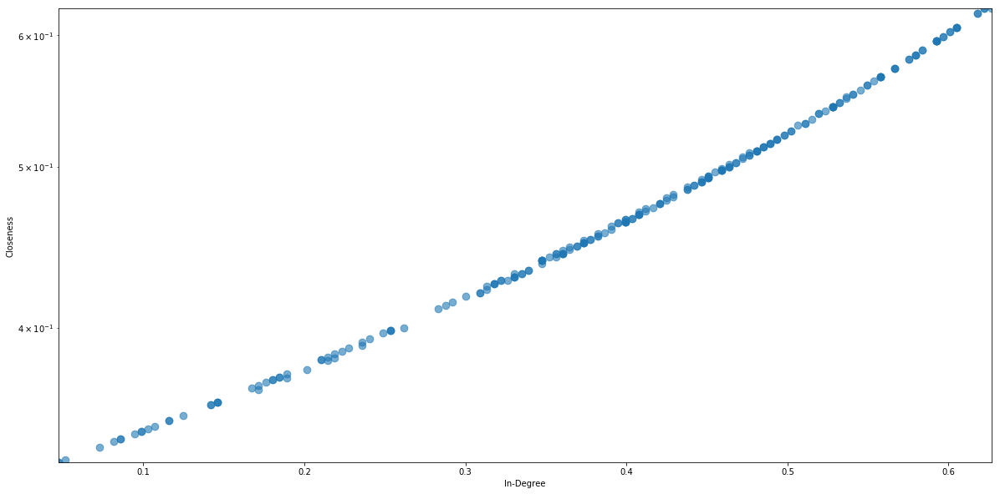

In [364]:
plt.rcParams['figure.figsize']=(20,10)

X = "In-Degree"
Y = "Closeness"
limits = pd.concat([centralities[[X, Y]].min(),
                    centralities[[X, Y]].max()], axis=1).values
centralities.plot(kind="scatter", x=X, y=Y, xlim=limits[0], ylim=limits[1], s=75, logy=True, alpha=0.6)

In [214]:
# Degree centralities
nx.set_node_attributes(G16, dgr, 'dgr')
dgr_node_color = [float(G16.node[v]['dgr']) for v in G16]
nx.set_node_attributes(G16, idgr, 'in')
in_node_color = [float(G16.node[v]['in']) for v in G16]
nx.set_node_attributes(G16, odgr, 'out')
out_node_color = [float(G16.node[v]['out']) for v in G16]

# Closeness
nx.set_node_attributes(G16, clo, 'clo')
clo_node_color = [float(G16.node[v]['clo']) for v in G16]

# Eigenvector
nx.set_node_attributes(G16, eig, 'eigen')
eig_node_color = [float(G16.node[v]['eigen']) for v in G16]

# Betweenness
nx.set_node_attributes(G16, bet, 'betw')
bet_node_color = [float(G16.node[v]['betw']) for v in G16]

In [359]:
def centrality_graph(centrality_color = eig_node_color):
    # Visualization
    plt.rcParams['figure.figsize']=(20,10)

    # Calculate position of each node in G using networkx spring layout
    pos = nx.spring_layout(G16,k=25,iterations=3) 

    # Draw nodes
    nodes = nx.draw_networkx_nodes(G16, pos, node_size=node_size, node_color=centrality_color, alpha=0.5) 

    # Draw edges
    edges = nx.draw_networkx_edges(G16, pos, edge_color='lightgray', arrows=False, width=0.05)

    # Add labels
    nx.draw_networkx_labels(G16,pos,font_size=5)
    nodes.set_edgecolor('gray')

    # Add labels and title
    #plt.title('Global trade network, 2016', fontsize=12)

    # Bar with color scale for eigenvalues
    cbar = plt.colorbar(mappable=nodes, cax=None, ax=None, fraction=0.015, pad=0.04)
    cbar.set_clim(0, 1)

    # Plot options
    plt.margins(0,0)
    plt.axis('off')

    plt.show()

#plt.savefig('760200.png', dpi=1000)

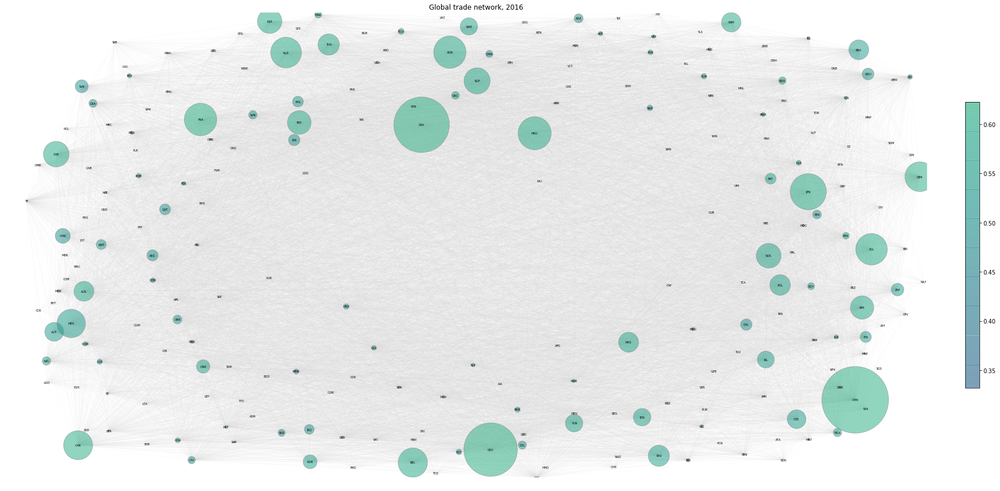

In [257]:
centrality_graph(centrality_color = clo_node_color)

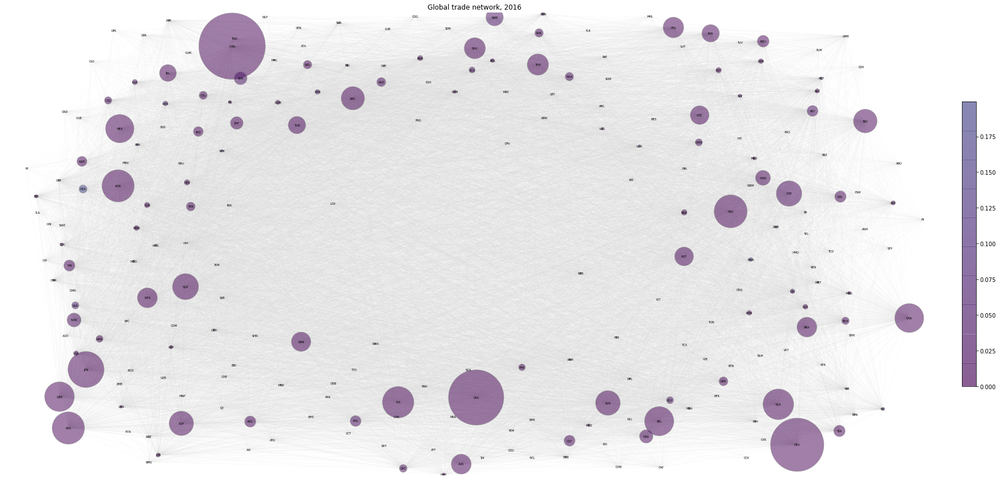

In [258]:
centrality_graph(centrality_color = bet_node_color)

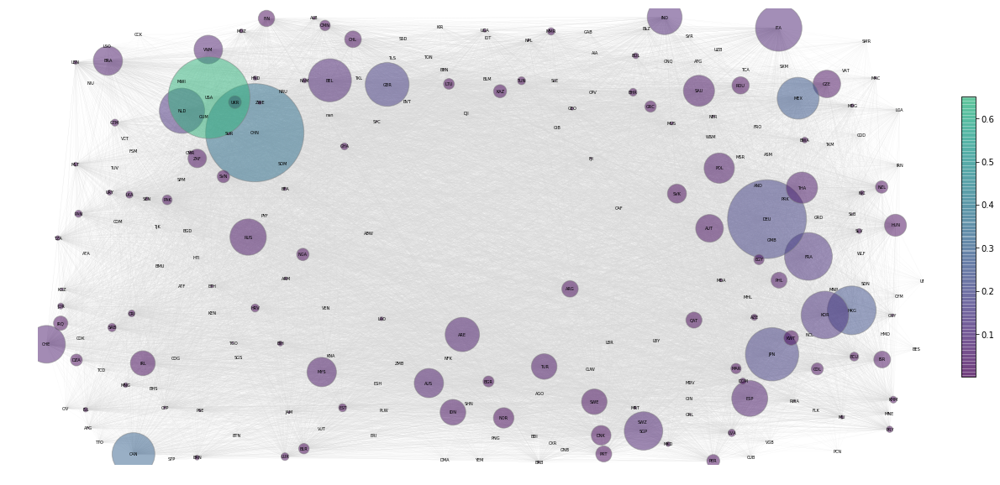

In [360]:
eig = nx.eigenvector_centrality(G16, weight='TradeValue')
nx.set_node_attributes(G16, eig, 'eigen')
eig_node_color = [float(G16.node[v]['eigen']) for v in G16]
centrality_graph(centrality_color = eig_node_color)

**Community partitioning for 2016** - Modularity maximization using Newman's spectral method

In [476]:
from modularity_maximization import partition
from modularity_maximization.utils import get_modularity
comm16_dict=partition(G16)
get_modularity(G16,comm16_dict)

Calculating modularity for directed graph


0.0564193641603021

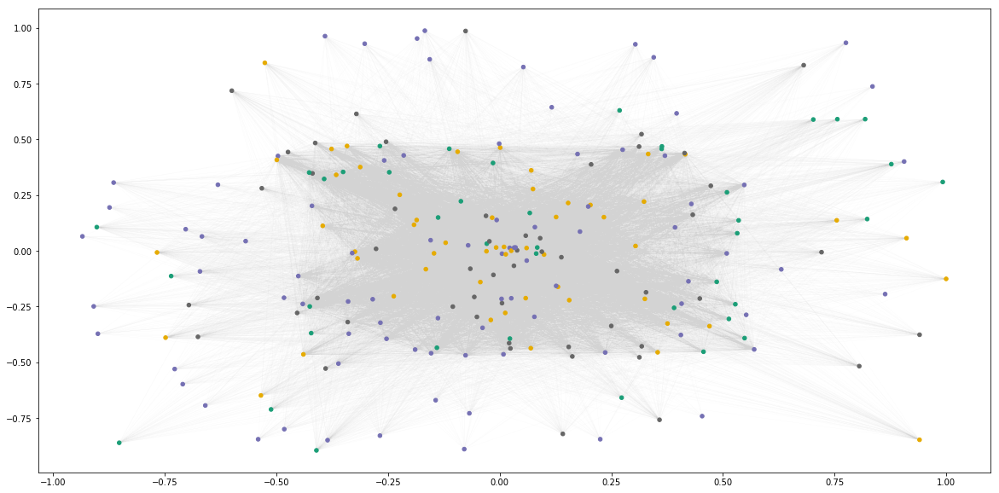

In [363]:
plt.rcParams['figure.figsize']=(20,10)

colors2 = [comm16_dict.get(node) for node in G16.nodes ()] 
pos = nx.spring_layout(G16, iterations=2)
nx.draw_networkx_nodes (G16, pos, cmap = plt.get_cmap('Dark2'), node_color = colors2 ,
                                node_size = 20 , with_labels = False) #Node size = totalexports?
nx.draw_networkx_edges (G16, pos, alpha = .5, edge_color='lightgray', arrows=False, width=0.05)

plt.show()

In [224]:
part_as_series = pd.Series(comm16_dict)
#part_as_series.sort_values()
part_as_series.value_counts()

4    86
5    55
6    52
3    41
dtype: int64

In [285]:
part3 = {k for k,v in comm16_dict.items() if v==3}
print(list(map(name_dict.get, part3)))

[None, 'Cuba', 'Swaziland', 'Trinidad and Tobago', 'Nicaragua', 'Bahamas', 'Antigua and Barbuda', 'Venezuela (Bolivarian Republic of)', 'Jamaica', 'Saint Vincent and the Grenadines', 'Virgin Islands (British)', 'CuraÃ§ao', 'Anguilla', 'Honduras', 'Israel', 'Greece', 'Guatemala', 'El Salvador', 'Haiti', 'Saint Lucia', 'Finland', 'Dominican Republic', 'Costa Rica', "Korea (Democratic People's Republic of)", 'Cayman Islands', 'Aruba', 'Chile', 'Panama', 'Suriname', 'Belize', 'Montserrat', 'Grenada', 'Barbados', 'Turkey', 'Dominica', 'Bolivia (Plurinational State of)', 'Brazil', 'Czechia', 'Saint Kitts and Nevis', 'China', 'Guyana']


In [286]:
part4 = {k for k,v in comm16_dict.items() if v==4}
print(list(map(name_dict.get, part4)))

['Sint Maarten (Dutch part)', 'Wallis and Futuna', 'Vanuatu', 'Guam', 'Japan', 'Myanmar', 'Niue', 'Faroe Islands', 'Singapore', 'Thailand', 'Saint Helena, Ascension and Tristan da Cunha', 'Malaysia', 'Maldives', 'Solomon Islands', 'New Caledonia', 'Macao', 'French Southern Territories', 'Falkland Islands (Malvinas)', 'Tonga', 'Marshall Islands', 'Timor-Leste', 'Antarctica', 'Tokelau', 'Poland', 'Lesotho', 'Spain', 'United States Minor Outlying Islands', 'Bermuda', 'Cocos (Keeling) Islands', 'Heard Island and McDonald Islands', 'Bouvet Island', 'Palestine, State of', 'Christmas Island', 'Cook Islands', 'Austria', 'Kiribati', 'Cabo Verde', 'New Zealand', 'Fiji', 'Western Sahara', 'Canada', 'Australia', 'Pitcairn', 'British Indian Ocean Territory', 'Micronesia (Federated States of)', 'Saint BarthÃ©lemy', 'Denmark', 'Switzerland', 'India', 'Korea (Republic of)', 'Belgium', 'San Marino', 'Germany', 'Italy', 'Holy See', 'Andorra', 'Philippines', 'Netherlands', 'Eritrea', 'France', 'Samoa', '

In [287]:
part5 = {k for k,v in comm16_dict.items() if v==5}
print(list(map(name_dict.get, part5)))

['Libya', 'Georgia', 'Bahrain', 'Argentina', 'Cyprus', 'Montenegro', 'Saudi Arabia', 'Hungary', 'Colombia', 'Nepal', 'Somalia', 'Slovenia', 'Macedonia (the former Yugoslav Republic of)', 'Yemen', 'Luxembourg', 'Ukraine', 'Peru', 'Tajikistan', 'Uzbekistan', 'Azerbaijan', 'Estonia', 'Moldova (Republic of)', 'Syrian Arab Republic', 'Turkmenistan', 'Sri Lanka', 'Bangladesh', 'Cambodia', 'Malta', 'Paraguay', 'Albania', 'Algeria', 'Kuwait', 'Iran (Islamic Republic of)', 'Oman', 'Mexico', 'Croatia', 'Qatar', 'Russian Federation', 'Kazakhstan', 'Ecuador', 'Serbia', 'Egypt', 'Iraq', 'Afghanistan', 'Kyrgyzstan', 'Armenia', 'Pakistan', 'Jordan', 'Latvia', 'Romania', 'Slovakia', 'Belarus', 'Bosnia and Herzegovina', 'Uruguay', 'Lithuania']


In [288]:
part6 = {k for k,v in comm16_dict.items() if v==6}
print(list(map(name_dict.get, part6)))

['Viet Nam', 'Congo (Democratic Republic of the)', 'Guinea-Bissau', 'Bulgaria', 'Nigeria', 'Ethiopia', 'South Africa', "CÃ´te d'Ivoire", 'Burundi', 'Comoros', 'Tunisia', 'Zimbabwe', 'Congo', 'Tanzania, United Republic of', 'Sudan', 'Lebanon', 'United Arab Emirates', 'Seychelles', 'Benin', 'Liberia', 'Madagascar', 'Chad', 'Senegal', 'Mauritania', 'Zambia', 'Cameroon', 'Gambia', 'Togo', 'Mali', 'Equatorial Guinea', 'Malawi', 'Rwanda', 'Hong Kong', 'Ireland', 'Burkina Faso', 'Botswana', 'Uganda', 'Portugal', 'Niger', 'Sierra Leone', 'Morocco', 'Gabon', 'Namibia', 'Djibouti', 'Mauritius', 'Angola', 'Kenya', 'Mozambique', 'Ghana', 'Guinea', 'Norway', 'Central African Republic']


**Partitions - 1990**

In [344]:
comm90_dict=partition(G90)
get_modularity(G90,comm90_dict)

Calculating modularity for directed graph


0.07233389233428765

In [345]:
part_as_series = pd.Series(comm90_dict)
#part_as_series.sort_values()
part_as_series.value_counts()

1    113
2     84
dtype: int64

In [347]:
part1 = {k for k,v in comm90_dict.items() if v==1}
print(list(map(name_dict.get, part1)))

['Viet Nam', 'Nicaragua', 'Wallis and Futuna', 'Vanuatu', 'Seychelles', 'Niue', 'Faroe Islands', 'Gambia', 'El Salvador', 'Finland', 'Guadeloupe', 'Thailand', 'Dominican Republic', 'Saint Helena, Ascension and Tristan da Cunha', 'Malaysia', 'Maldives', 'Solomon Islands', 'New Caledonia', 'Niger', 'Brunei Darussalam', 'French Southern Territories', 'Macao', 'Belize', 'Falkland Islands (Malvinas)', 'Grenada', 'Tonga', 'Angola', 'Brazil', 'Tokelau', 'Congo (Democratic Republic of the)', 'Trinidad and Tobago', 'Guinea-Bissau', 'Spain', 'Comoros', 'Jamaica', 'Bermuda', 'Saint Vincent and the Grenadines', 'Cocos (Keeling) Islands', None, 'Benin', 'Christmas Island', 'Cook Islands', 'RÃ©union', 'Kiribati', 'Cabo Verde', None, 'Albania', 'Cayman Islands', 'Aruba', None, 'Suriname', 'Portugal', 'New Zealand', 'Fiji', 'Montserrat', 'Western Sahara', 'Canada', 'Australia', 'Djibouti', 'Mauritius', 'Pitcairn', 'Central African Republic', 'British Indian Ocean Territory', 'Burundi', 'Antigua and Ba

In [348]:
part2 = {k for k,v in comm90_dict.items() if v==2}
print(list(map(name_dict.get, part2)))

['Libya', None, None, 'Bahrain', 'Argentina', 'Cyprus', 'Bulgaria', 'Nigeria', 'Ethiopia', 'Saudi Arabia', 'Hungary', 'Bahamas', "CÃ´te d'Ivoire", 'South Africa', 'Colombia', 'United Kingdom of Great Britain and Northern Ireland', 'Tunisia', 'United States of America', 'Somalia', 'Tanzania, United Republic of', 'Venezuela (Bolivarian Republic of)', 'Sudan', 'Lebanon', 'United Arab Emirates', None, 'Yemen', 'Peru', 'Myanmar', 'Belgium', 'Israel', 'Liberia', 'Greece', 'Madagascar', 'Austria', 'Guatemala', 'Singapore', 'Syrian Arab Republic', None, 'Zambia', 'Cameroon', 'Togo', 'Sri Lanka', 'Bangladesh', 'Sweden', 'Iceland', 'Malawi', 'Malta', 'Hong Kong', 'Paraguay', 'Algeria', 'Ireland', "Korea (Democratic People's Republic of)", 'Iran (Islamic Republic of)', 'Kuwait', 'Germany', 'Chile', 'Oman', 'Qatar', 'Italy', 'Panama', 'Uganda', 'Sierra Leone', 'Egypt', 'Morocco', 'Iraq', 'Gabon', 'Romania', 'Pakistan', 'Jordan', None, 'Philippines', 'Indonesia', 'Netherlands', 'Turkey', 'Timor-Les

**Get 2016 data on a two-digit HS aggregation level**

In [297]:
#ag2016=comapi.getComtradeData(comcodes=['ag2'], reporter=['all'], partner=['all'], 
#                               years=[2016], freq='A', rg=['2'], fmt='json', rowmax=100000)
#ag2016.to_csv('TotalExports2016_ag2.csv')

ag2016 = pd.read_csv('TotalExports2016_ag2.csv')

ag2 = ag2016[['cmdCode','TradeValue','rgDesc','rtCode','rtTitle','rt3ISO', 'ptCode', 'ptTitle', 'pt3ISO','yr']]
# Clean names
ag2.is_copy = False 
ag2['rtTitle'] = ag2['rtTitle'].str.extract(r"b'([A-Za-z]+)'", expand=False)
ag2['ptTitle'] = ag2['ptTitle'].str.extract(r"b'([A-Za-z]+)'", expand=False)
# Remove each countries total world exports
ag2 = ag2[ag2.ptCode != 0]
# Add regions and sub regions for all reporters and partners
ag2 = pd.merge(ag2, region[['alpha-3','rtregion','rtsub-region']], 
                 left_on='rt3ISO', right_on='alpha-3', how='left')
ag2 = pd.merge(ag2, region[['alpha-3','ptregion','ptsub-region']],
                 left_on='pt3ISO', right_on='alpha-3', how='left')
# Check out results
ag2.head()

,cmdCode,TradeValue,rgDesc,rtCode,rtTitle,rt3ISO,ptCode,ptTitle,pt3ISO,yr,alpha-3_x,rtregion,rtsub-region,alpha-3_y,ptregion,ptsub-region
0,1,584025,Export,8,Albania,ALB,381,Italy,ITA,2016,ALB,Europe,Southern Europe,ITA,Europe,Southern Europe
1,1,335,Export,8,Albania,ALB,499,Montenegro,MNE,2016,ALB,Europe,Southern Europe,MNE,Europe,Southern Europe
2,1,87581,Export,8,Albania,ALB,688,Serbia,SRB,2016,ALB,Europe,Southern Europe,SRB,Europe,Southern Europe
3,1,126400,Export,12,Algeria,DZA,251,France,FRA,2016,DZA,Africa,Northern Africa,FRA,Europe,Western Europe
4,2,1063145,Export,8,Albania,ALB,381,Italy,ITA,2016,ALB,Europe,Southern Europe,ITA,Europe,Southern Europe


In [300]:
Gag16 = nx.from_pandas_edgelist(ag2, 'rt3ISO', 'pt3ISO', edge_attr=['TradeValue', 'cmdCode'], create_using=nx.MultiDiGraph())
print(nx.info(Gag16))

Name: 
Type: MultiDiGraph
Number of nodes: 234
Number of edges: 655753
Average in degree: 2802.3632
Average out degree: 2802.3632


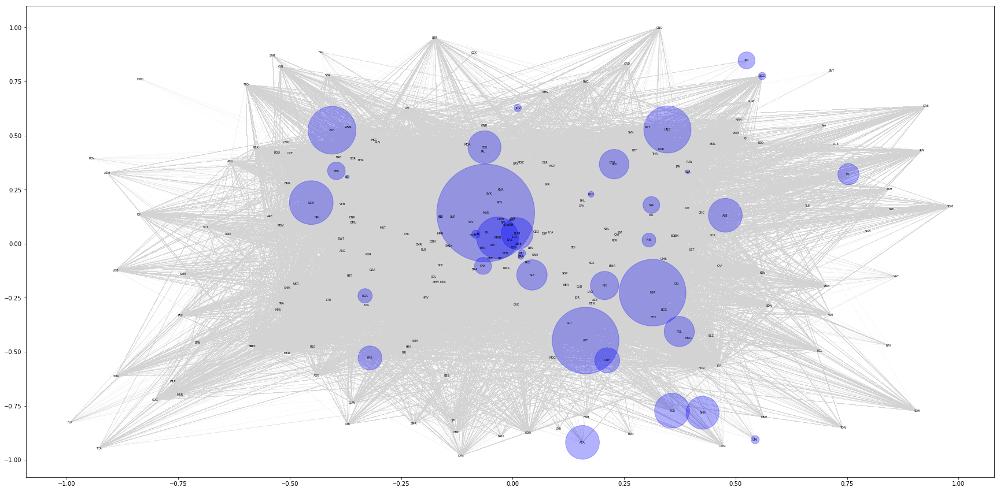

In [301]:
pos = nx.spring_layout(Gag16, iterations=2)
nx.draw_networkx_nodes (Gag16, pos, cmap = plt.get_cmap('Dark2'), node_color = 'blue',
                        node_size = node_size_90 , with_labels = False, alpha=0.3)
nx.draw_networkx_edges (Gag16, pos, alpha = .5, edge_color='lightgray', arrows=False, width=0.05)
nx.draw_networkx_labels(Gag16,pos,font_size=5)

plt.show()

**Cereal Market - 2016**

In [305]:
# Subset dataframe, as data rate otherwise will be exceeded working with the full dataset for 2016
cereal=ag2[ag2['cmdCode'] == 10]
Gcer = nx.from_pandas_edgelist(cereal, 'rt3ISO', 'pt3ISO', edge_attr=['TradeValue'], create_using=nx.DiGraph())
print(nx.info(Gcer))

Name: 
Type: DiGraph
Number of nodes: 224
Number of edges: 5062
Average in degree:  22.5982
Average out degree:  22.5982


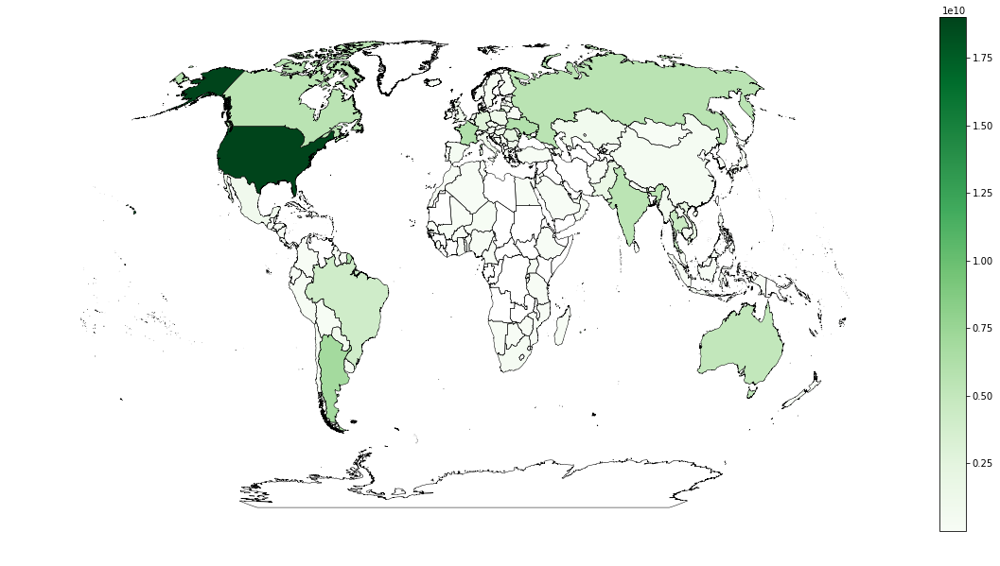

In [446]:
gcer_ex = pd.DataFrame({'TradeValue' : cereal.groupby( ["rt3ISO"] )["TradeValue"].sum()}).reset_index()
world_map(gcer_ex)

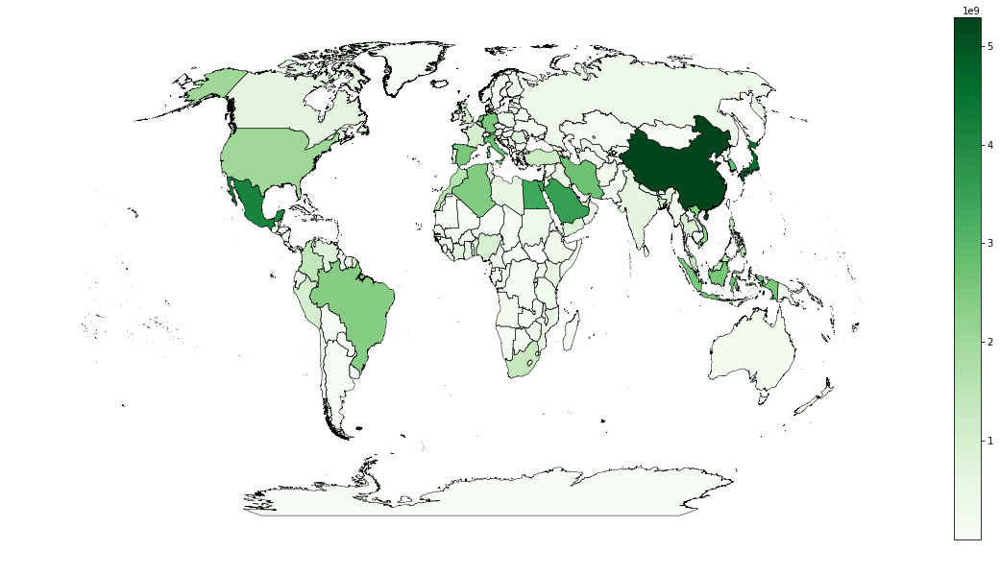

In [449]:
gcer_im = pd.DataFrame({'TradeValue' : cereal.groupby( ["pt3ISO"] )["TradeValue"].sum()}).reset_index()
world_map_imp(gcer_im)

In [337]:
centrality_top10(Gcer)

,Eigenvector,Closeness,Degree,In-Degree,Out-Degree,Betweenness
0,Mexico,United States of America,United States of America,United States of America,United States of America,Korea (Republic of)
1,Japan,United Kingdom of Great Britain and Northern I...,France,United Kingdom of Great Britain and Northern I...,Thailand,Ethiopia
2,China,France,India,France,India,Madagascar
3,Netherlands,Netherlands,Germany,Italy,France,Switzerland
4,Algeria,Germany,Thailand,Netherlands,Argentina,France
5,Korea (Republic of),Italy,Italy,Germany,Germany,NaN
6,Belgium,NaN,Canada,NaN,Pakistan,Mexico
7,Saudi Arabia,Canada,Netherlands,Canada,Canada,Germany
8,Italy,Spain,Spain,United Arab Emirates,Italy,Lebanon
9,Germany,United Arab Emirates,United Kingdom of Great Britain and Northern I...,Belgium,Viet Nam,Sierra Leone


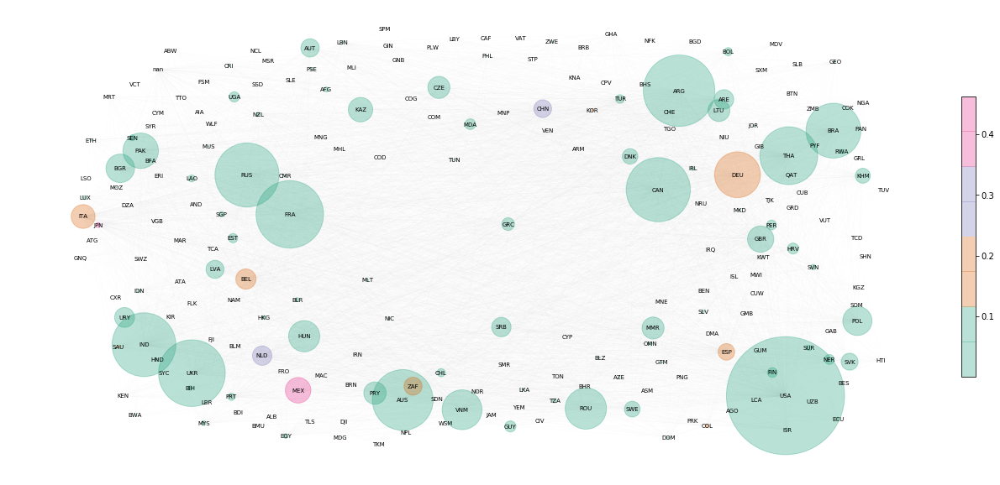

In [472]:
eig = nx.eigenvector_centrality(Gcer, weight='TradeValue')
nx.set_node_attributes(Gcer, eig, 'eigen')
eig_node_color = [float(Gcer.node[v]['eigen']) for v in Gcer]
#node_size_cer = totexp(Gcer, size=100000)

pos = nx.spring_layout(Gcer, k=50, iterations=5)
nodes=nx.draw_networkx_nodes (Gcer, pos, cmap = plt.get_cmap('Dark2'), node_color = eig_node_color,
                        node_size = node_size_cer , with_labels = False, alpha=0.3)
edges=nx.draw_networkx_edges (Gcer, pos, alpha = .5, edge_color='lightgray', arrows=False, width=0.05)
nx.draw_networkx_labels(Gcer,pos,font_size=7)
cbar = plt.colorbar(mappable=nodes, cax=None, ax=None, fraction=0.015, pad=0.04)
cbar.set_clim(0, 1)
plt.axis('off')

plt.show()

**Steel Market - 2016**

In [314]:
steel=ag2[ag2['cmdCode'] == 72]
Gsteel = nx.from_pandas_edgelist(steel, 'rt3ISO', 'pt3ISO', edge_attr=['TradeValue'], create_using=nx.DiGraph())
print(nx.info(Gsteel))

Name: 
Type: DiGraph
Number of nodes: 229
Number of edges: 7470
Average in degree:  32.6201
Average out degree:  32.6201


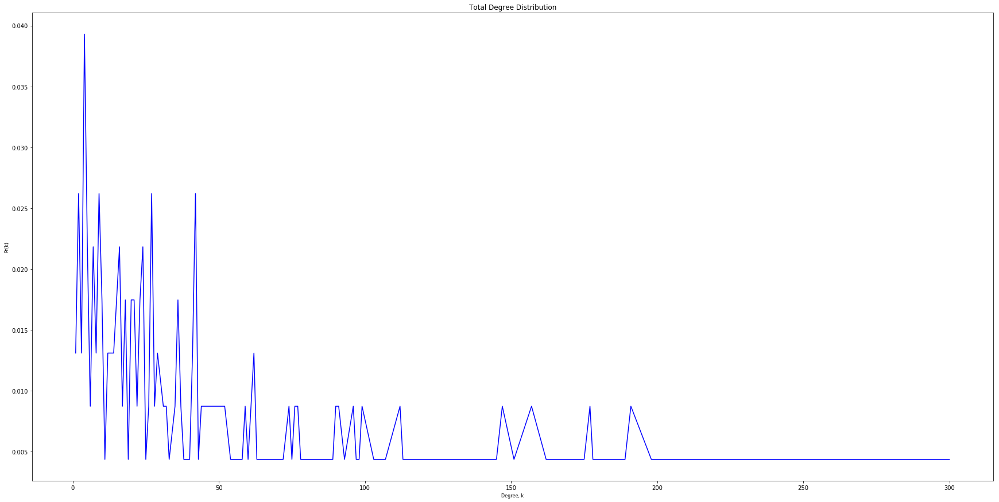

In [335]:
plot_degree_distribution(Gsteel, degree='Total')

In [336]:
nx.set_node_attributes(Gsteel, area_dict, 'region')
nx.attribute_assortativity_coefficient(Gsteel, "region")

0.07038109035013936

In [325]:
def centrality_top10(G16):
    dgr = nx.degree_centrality(G16)
    idgr = nx.in_degree_centrality(G16)
    odgr = nx.out_degree_centrality(G16)
    # Closeness - Reverse also? Djikstra?
    clo = nx.closeness_centrality(G16)
    # Eigenvector (weighted)
    eig = nx.eigenvector_centrality(G16, weight='TradeValue')
    # Betweenness - k? weight? normalize?
    bet = nx.betweenness_centrality(G16, weight='TradeValue')

    centralities = pd.concat([pd.Series(c) for c in (eig, clo, dgr, idgr, odgr, bet)],axis=1)

    centralities.columns = ("Eigenvector", "Closeness", "Degree", "In-Degree","Out-Degree","Betweenness")
    top10 = pd.DataFrame()
    name_dict = dict(zip(region['alpha-3'], region['name']))
    for col in list (centralities.columns):
        top = list(centralities.nlargest(10, col).index)
        top10[col] = pd.Series(top)
        top10[col].replace(name_dict, inplace=True)
    return top10

In [326]:
centrality_top10(Gsteel)

,Eigenvector,Closeness,Degree,In-Degree,Out-Degree,Betweenness
0,United States of America,India,China,India,China,Brunei Darussalam
1,Germany,China,Netherlands,United States of America,Netherlands,Thailand
2,Korea (Republic of),United States of America,India,China,India,Canada
3,China,NaN,United States of America,NaN,Turkey,Philippines
4,Mexico,Netherlands,Germany,Netherlands,Germany,Brazil
5,Italy,Germany,Turkey,Germany,United States of America,Finland
6,France,United Arab Emirates,Spain,United Arab Emirates,Belgium,"Tanzania, United Republic of"
7,Viet Nam,United Kingdom of Great Britain and Northern I...,NaN,United Kingdom of Great Britain and Northern I...,Italy,Czechia
8,Canada,Spain,United Kingdom of Great Britain and Northern I...,Spain,Spain,Croatia
9,Belgium,Korea (Republic of),Italy,Korea (Republic of),United Kingdom of Great Britain and Northern I...,Switzerland


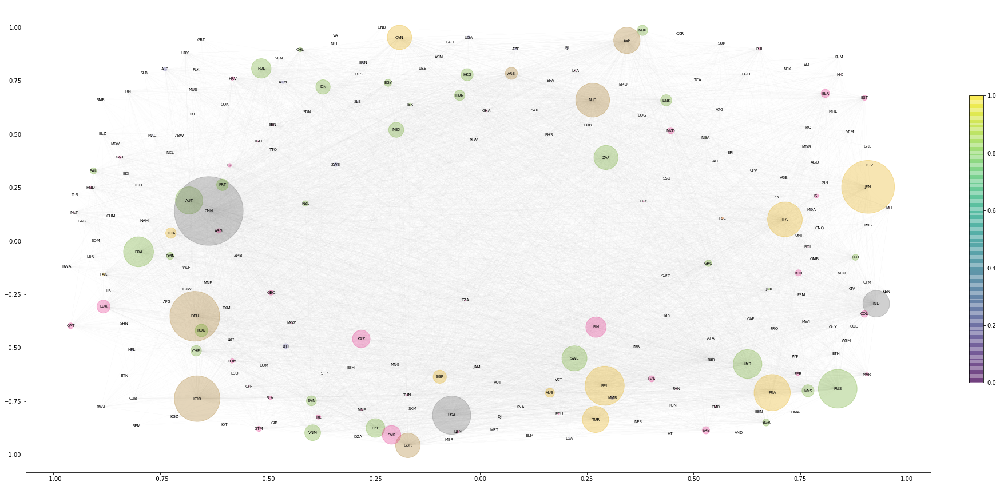

In [324]:
# Closeness
clo = nx.closeness_centrality(Gsteel)
nx.set_node_attributes(Gsteel, clo, 'clo')
clo_node_color = [float(Gsteel.node[v]['clo']) for v in Gsteel]

node_size_steel = totexp(Gsteel)
pos = nx.spring_layout(Gsteel, k=50, iterations=5)
nx.draw_networkx_nodes (Gsteel, pos, cmap = plt.get_cmap('Dark2'), node_color = clo_node_color,
                        node_size = node_size_steel , with_labels = False, alpha=0.3)
nx.draw_networkx_edges (Gsteel, pos, alpha = .5, edge_color='lightgray', arrows=False, width=0.05)
nx.draw_networkx_labels(Gsteel,pos,font_size=7)
cbar = plt.colorbar(mappable=nodes, cax=None, ax=None, fraction=0.015, pad=0.04)
cbar.set_clim(0, 1)

plt.show()

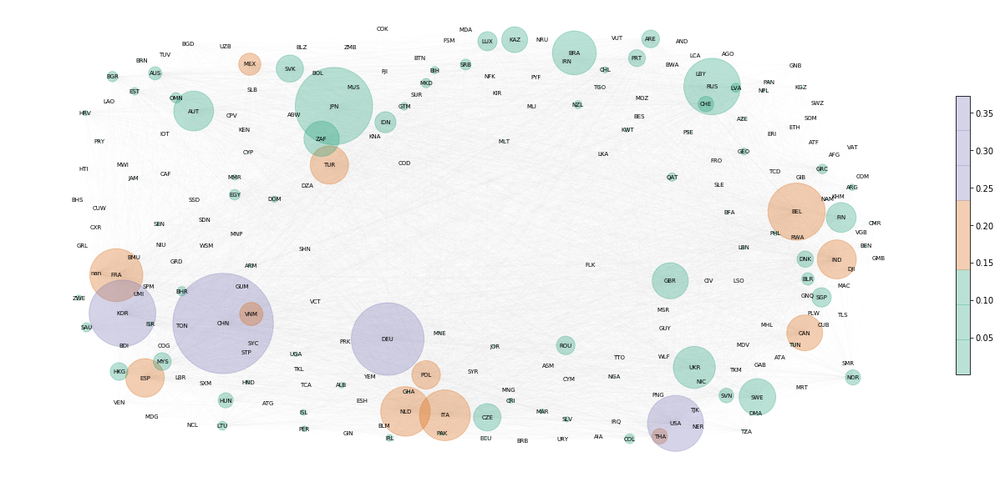

In [468]:
# Eigenvector
eig = nx.eigenvector_centrality(Gsteel, weight='TradeValue')
nx.set_node_attributes(Gsteel, eig, 'eigen')
eig_node_color = [float(Gsteel.node[v]['eigen']) for v in Gsteel]

#node_size_steel = totexp(Gsteel)
pos = nx.spring_layout(Gsteel, k=50, iterations=5)
nodes = nx.draw_networkx_nodes (Gsteel, pos, cmap = plt.get_cmap('Dark2'), node_color = eig_node_color,
                        node_size = node_size_steel , with_labels = False, alpha=0.3)
edges = nx.draw_networkx_edges (Gsteel, pos, alpha = .5, edge_color='lightgray', arrows=False, width=0.05)
nx.draw_networkx_labels(Gsteel,pos,font_size=7)
cbar = plt.colorbar(mappable=nodes, cax=None, ax=None, fraction=0.015, pad=0.04)
cbar.set_clim(0, 1)
plt.axis('off')

plt.show()

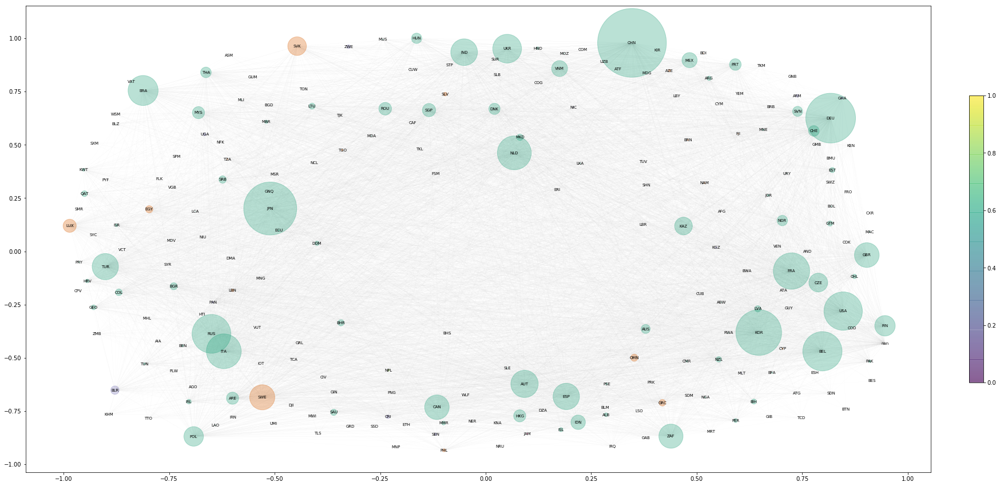

In [323]:
# Betweenness
bet = nx.betweenness_centrality(Gsteel, weight='TradeValue')
nx.set_node_attributes(Gsteel, bet, 'betw')
bet_node_color = [float(Gsteel.node[v]['betw']) for v in Gsteel]

node_size_steel = totexp(Gsteel)
pos = nx.spring_layout(Gsteel, k=50, iterations=5)
nx.draw_networkx_nodes (Gsteel, pos, cmap = plt.get_cmap('Dark2'), node_color = bet_node_color,
                        node_size = node_size_steel , with_labels = False, alpha=0.3)
nx.draw_networkx_edges (Gsteel, pos, alpha = .5, edge_color='lightgray', arrows=False, width=0.05)
nx.draw_networkx_labels(Gsteel,pos,font_size=7)
cbar = plt.colorbar(mappable=nodes, cax=None, ax=None, fraction=0.015, pad=0.04)
cbar.set_clim(0, 1)

plt.show()

**Fossil Fuel Market - 2016**

In [338]:
fuel=ag2[ag2['cmdCode'] == 27]
Gfuel = nx.from_pandas_edgelist(fuel, 'rt3ISO', 'pt3ISO', edge_attr=['TradeValue'], create_using=nx.DiGraph())
print(nx.info(Gfuel))

Name: 
Type: DiGraph
Number of nodes: 230
Number of edges: 8142
Average in degree:  35.4000
Average out degree:  35.4000


In [443]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import geopandas as gpd

def world_map(df, colormap='Greens'):
    shapefile = 'ne_10m_admin_0_countries.shp'
    gdf = gpd.read_file(shapefile)[['ADM0_A3', 'geometry']].to_crs('+proj=robin')

    merged = gdf.merge(df, left_on='ADM0_A3', right_on='rt3ISO')

    f, ax = plt.subplots(1, figsize=(20,10))
    merged.plot(column ='TradeValue', ax=ax, cmap=colormap)
    gdf.plot(color='None', edgecolor='black', linewidth=0.5, ax=ax) 
    ax.axis('off')
    vmin = merged['TradeValue'].min()
    vmax = merged['TradeValue'].max()
    # Create colorbar
    sm = cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    cbar = f.colorbar(sm)

    #plt.show()

def world_map_imp(df, colormap='Greens'):
    shapefile = 'ne_10m_admin_0_countries.shp'
    gdf = gpd.read_file(shapefile)[['ADM0_A3', 'geometry']].to_crs('+proj=robin')

    merged = gdf.merge(df, left_on='ADM0_A3', right_on='pt3ISO')

    f, ax = plt.subplots(1, figsize=(20,10))
    merged.plot(column ='TradeValue', ax=ax, cmap=colormap)
    gdf.plot(color='None', edgecolor='black', linewidth=0.5, ax=ax) 
    ax.axis('off')
    vmin = merged['TradeValue'].min()
    vmax = merged['TradeValue'].max()
    # Create colorbar
    sm = cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    cbar = f.colorbar(sm)

    #plt.show()

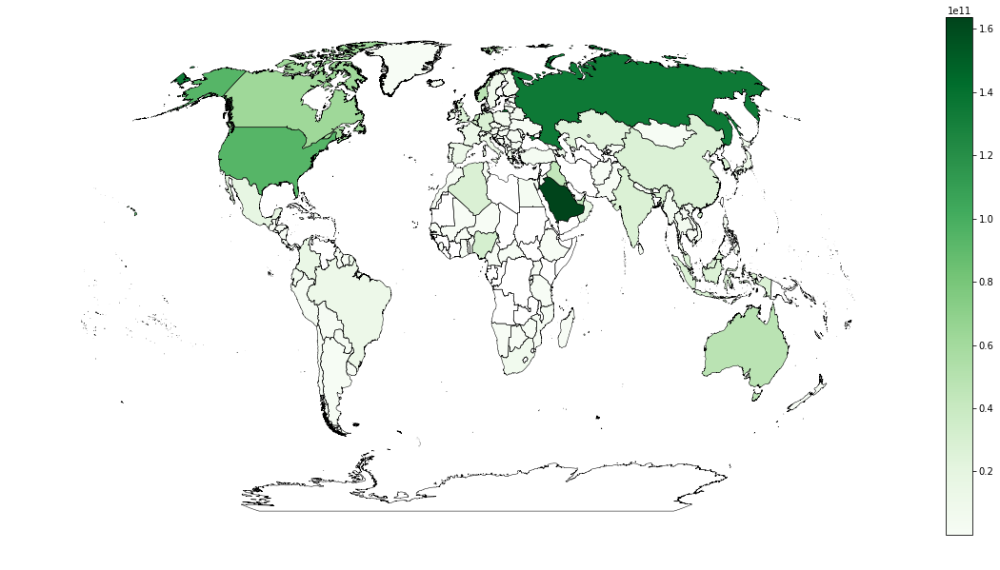

In [444]:
#fuel_ag = pd.DataFrame({'TradeValue' : fuel.groupby( ["rt3ISO"] )["TradeValue"].sum()}).reset_index()
#fuel_im = pd.DataFrame({'TradeValue' : fuel.groupby( ["pt3ISO"] )["TradeValue"].sum()}).reset_index()
Y
world_map(fuel_ag)

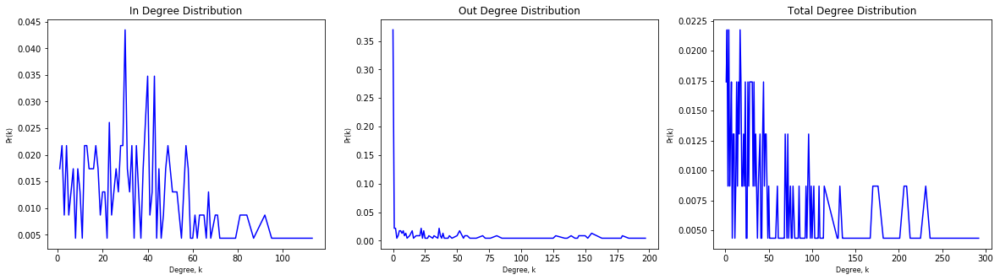

In [434]:
plt.rcParams['figure.figsize']=(20,5)

fig = plt.figure()
fig.add_subplot(131)
plot_degree_distribution(Gfuel, degree='In')
fig.add_subplot(132)
plot_degree_distribution(Gfuel, degree='Out')
fig.add_subplot(133)
plot_degree_distribution(Gfuel, degree='Total')

plt.show()

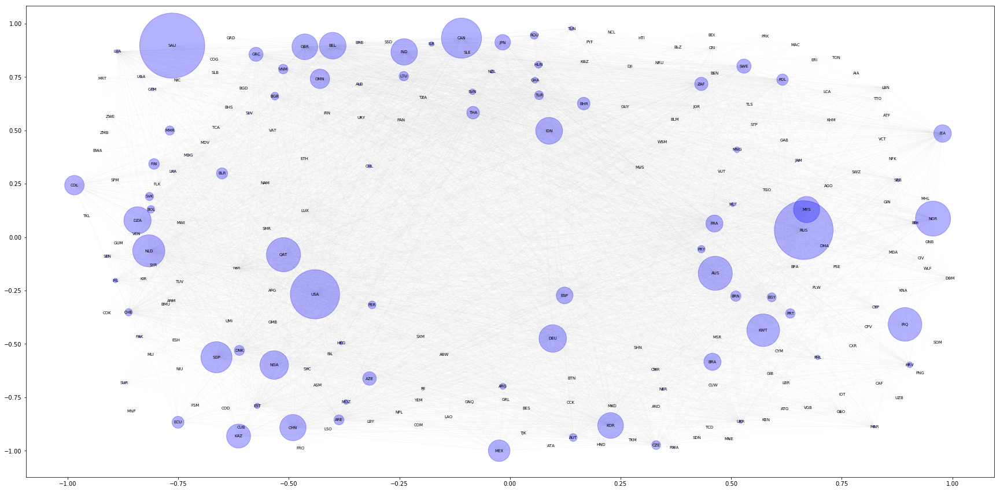

In [339]:
node_size_fuel = totexp(Gfuel, size=100000)

pos = nx.spring_layout(Gfuel, k=50, iterations=5)
nx.draw_networkx_nodes (Gfuel, pos, cmap = plt.get_cmap('Dark2'), node_color = 'blue',
                        node_size = node_size_fuel , with_labels = False, alpha=0.3)
nx.draw_networkx_edges (Gfuel, pos, alpha = .5, edge_color='lightgray', arrows=False, width=0.05)
nx.draw_networkx_labels(Gfuel,pos,font_size=7)

plt.show()

In [432]:
def centrality_top10_v2(G16):
    dgr = nx.degree_centrality(G16)
    idgr = nx.in_degree_centrality(G16)
    odgr = nx.out_degree_centrality(G16)
    # Closeness 
    clo = nx.closeness_centrality(G16)
    # Eigenvector - old method fails when there are multiple eigenvalues with the same (largest) magnitude. 
    eig = nx.eigenvector_centrality_numpy(Gfuel, weight='TradeValue')
    # Betweenness 
    bet = nx.betweenness_centrality(G16, weight='TradeValue')

    centralities = pd.concat([pd.Series(c) for c in (eig, clo, dgr, idgr, odgr, bet)],axis=1)

    centralities.columns = ("Eigenvector", "Closeness", "Degree", "In-Degree","Out-Degree","Betweenness")
    top10 = pd.DataFrame()
    name_dict = dict(zip(region['alpha-3'], region['name']))
    for col in list (centralities.columns):
        top = list(centralities.nlargest(10, col).index)
        top10[col] = pd.Series(top)
        top10[col].replace(name_dict, inplace=True)
    return top10

centrality_top10_v2(Gfuel)

,Eigenvector,Closeness,Degree,In-Degree,Out-Degree,Betweenness
0,United States of America,United States of America,Netherlands,United States of America,Netherlands,New Zealand
1,Mexico,NaN,United States of America,NaN,Belgium,Portugal
2,Canada,United Kingdom of Great Britain and Northern I...,France,United Kingdom of Great Britain and Northern I...,China,Senegal
3,Netherlands,France,China,France,France,Denmark
4,China,Netherlands,Belgium,Netherlands,United States of America,Finland
5,Singapore,United Arab Emirates,United Kingdom of Great Britain and Northern I...,Germany,Turkey,Namibia
6,Brazil,Germany,Italy,United Arab Emirates,Italy,Oman
7,Japan,China,Germany,China,United Kingdom of Great Britain and Northern I...,Canada
8,France,Spain,Turkey,Italy,Germany,Romania
9,Korea (Republic of),Italy,Spain,Spain,Korea (Republic of),South Africa
